In [1]:
from random import randint
import math
from PIL import Image, ImageDraw, ImageFont, ImageFilter, ImageOps

In [3]:
drive = True

if drive:
    from google.colab import drive
    # MOUNT DRIVE
    drive.mount('/content/drive', force_remount=True)
    font_path = '/content/drive/MyDrive/DeepLearning_2023/Final/Fonts/RockwellNova-Bold.ttf'
    output_path = '/content/drive/MyDrive/DeepLearning_2023/Final/Data/synth_samples/'

else: # LOCAL
    font_path = "./Fonts/ROCKWELLNOVA-BOLD.ttf"

Mounted at /content/drive


In [4]:
# UTILS
def single_character_to_int(c): # Converts char to int label
    if c.isdigit():
        return int(c)
    else:
        return int(ord(c) - 87)
    
def int_to_single_character(i): # Converts int label to char
    if i<10:
        return str(i)
    else:
        return str(chr(i + 87))
    
class WaveDeformer:
    
    def __init__(self, amplitude, period):
        self.amplitude = amplitude
        self.period = period
    
    def transform(self, x, y):
        y = y + self.amplitude*math.sin(x/self.period)
        return x, y

    def transform_rectangle(self, x0, y0, x1, y1):
        return (*self.transform(x0, y0),
                *self.transform(x0, y1),
                *self.transform(x1, y1),
                *self.transform(x1, y0),
                )

    def getmesh(self, img):
        self.w, self.h = img.size
        gridspace = 20

        target_grid = []
        for x in range(0, self.w, gridspace):
            for y in range(0, self.h, gridspace):
                target_grid.append((x, y, x + gridspace, y + gridspace))

        source_grid = [self.transform_rectangle(*rect) for rect in target_grid]

        return [t for t in zip(target_grid, source_grid)]
    
def generate_gradient(
        colour1: str, colour2: str, width: int, height: int) -> Image:
    """Generate a vertical gradient."""
    base = Image.new('RGB', (width, height), colour1)
    top = Image.new('RGB', (width, height), colour2)
    mask = Image.new('L', (width, height))
    mask_data = []
    for y in range(height):
        mask_data.extend([int(255 * (y / height))] * width)
    mask.putdata(mask_data)
    base.paste(top, (0, 0), mask)
    return base

In [5]:
def generateRandomLabel():
    label_list = [int_to_single_character(randint(0, 35)) for i in range(5)]
    label = "".join(label_list)
    return label

In [6]:
def generateImageFromLabel(label):
    width = 200
    height = 50

    img = Image.new('RGBA', (width, height), color = (None))
    d = ImageDraw.Draw(img)

    fnt = ImageFont.truetype(font_path, 36)

    d.multiline_text((width/2+5, height/2+12), label, font=fnt, anchor="ms", align='center', spacing=40, fill=(0, 0, 0, 255))
    img = ImageOps.deform(img, WaveDeformer(7, 4))

    background = Image.new('RGBA', (width, height), (200, 200, 200, 255))
    right = Image.new('RGBA', (width, height), (250, 250, 250, 255))
    mask = Image.new('L', (width, height))
    mask_data = []
    for y in range(height):
        for x in range(width):
            mask_data.append(int(255 * (x / width)))
    mask.putdata(mask_data)
    background.paste(right, (0, 0), mask)
    background.putalpha(255)

    background.alpha_composite(img)

    final_img = background
    d = ImageDraw.Draw(final_img)
    d.line([(randint(0, 70), randint(10, 40)), (randint(130, 200), randint(10, 40))], fill=(0, 0, 0, 255), width=4, joint=None)

    return final_img

eebxo


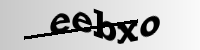

In [7]:
label = generateRandomLabel()
final_img = generateImageFromLabel(label)
print(label)
final_img.show()
final_img.save(output_path+label+".png", "PNG")

q77on


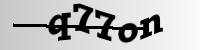

0639y


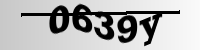

08qcl


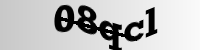

e059s


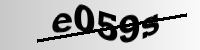

b6iyk


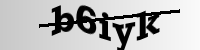

ifqna


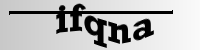

uhr0g


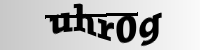

t8dl7


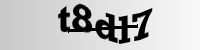

vp3nc


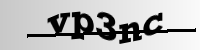

bgi14


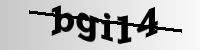

ofy2i


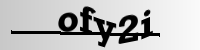

0p139


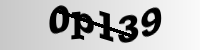

s6ykk


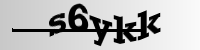

bwjfs


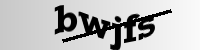

ic9i9


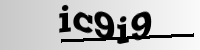

831iu


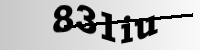

xvfne


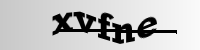

qm841


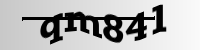

lo973


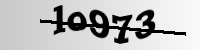

hjhae


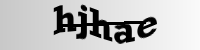

9qjkg


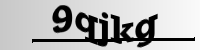

c28r0


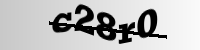

lhamw


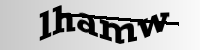

7qanc


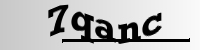

uzkzv


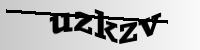

i2d8u


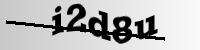

lpb0g


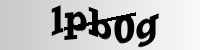

qv51y


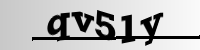

56ra2


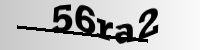

lbchf


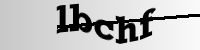

s0end


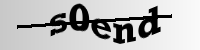

krdz0


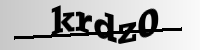

bv58r


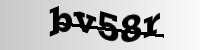

8z6gh


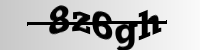

25rjm


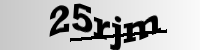

kdzd3


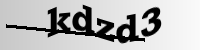

wr8dv


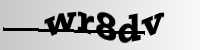

1u45e


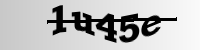

atpp8


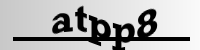

ceup4


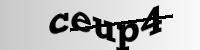

a9qhb


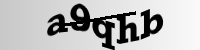

6y9bl


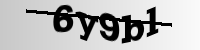

v8tvo


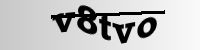

43i66


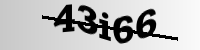

sppyk


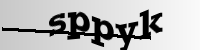

bxg7b


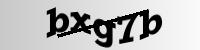

eobfy


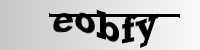

fc05e


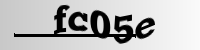

md3th


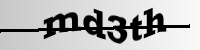

wzsta


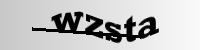

dlh92


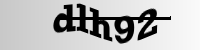

4fzie


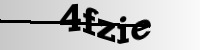

ga344


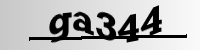

j0ddw


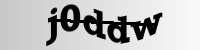

b9wi1


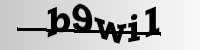

5qkni


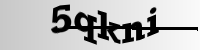

vbf2h


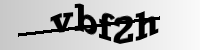

k4n58


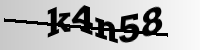

wou4u


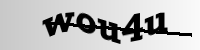

nyh6r


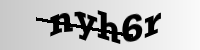

hu82g


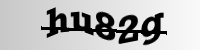

56t3w


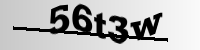

e99li


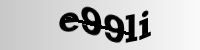

e9dxe


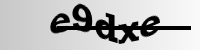

yjd0f


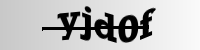

l9fl7


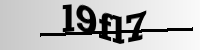

k4c9e


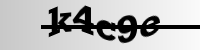

06yzx


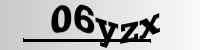

uxoun


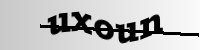

a7wip


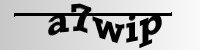

dnvr9


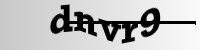

ptmi3


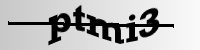

u232v


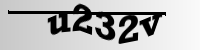

rog6r


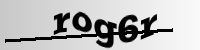

oly04


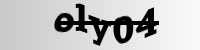

fsed0


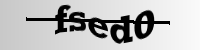

5nv2l


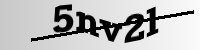

obkd0


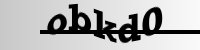

bce7u


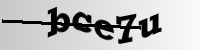

rzmuz


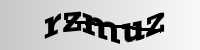

4u59h


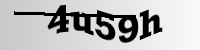

p1zh1


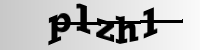

qkgkg


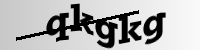

akwwe


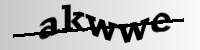

hjxpb


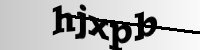

32rsa


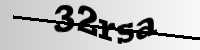

aqnpk


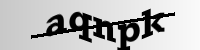

rdi6e


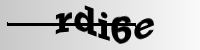

7qc31


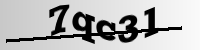

79b9k


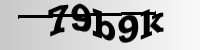

5nv5m


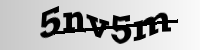

nk3ve


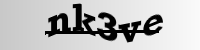

9rmc4


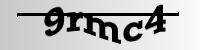

6wa53


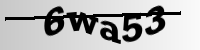

w5c7z


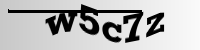

z7dpm


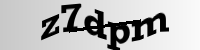

k3lax


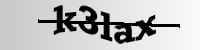

bjcgg


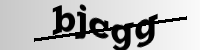

1o6ck


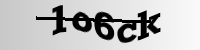

4t9rv


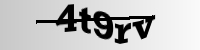

2xevk


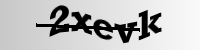

idn5u


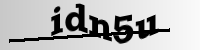

ctvq3


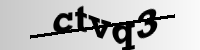

bu1qn


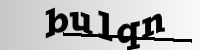

kv3jw


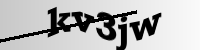

utyd3


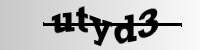

7gzir


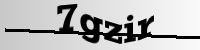

79i5z


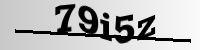

wv3m1


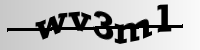

7skt4


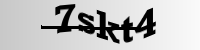

b28oe


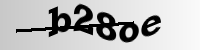

mwkh1


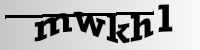

ai63c


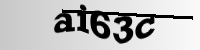

cxuz1


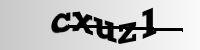

zfmvt


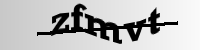

sy06c


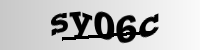

rwr9l


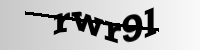

ghnml


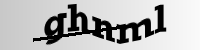

auq82


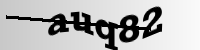

zjbgz


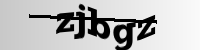

s81y9


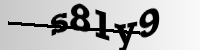

4uw4u


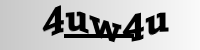

k3e70


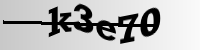

uaanl


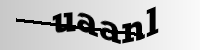

0lxvp


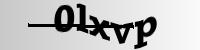

j8cq2


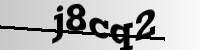

zdk4c


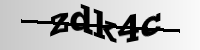

xwfxt


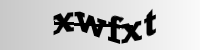

cvnnw


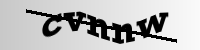

u0xka


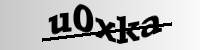

6ns63


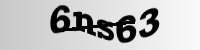

x7at7


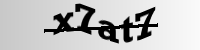

91x78


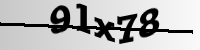

hg2k8


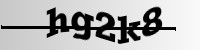

qqekx


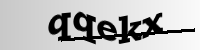

pgrbd


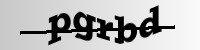

tmjke


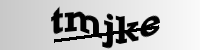

2u000


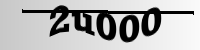

8kshj


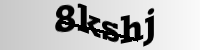

t80gp


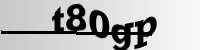

x1tyr


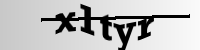

qtjj4


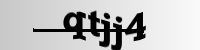

o6nzg


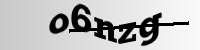

9q267


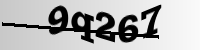

5z964


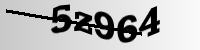

d4d2g


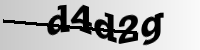

9osta


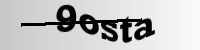

kckuq


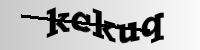

ju903


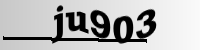

dxmb5


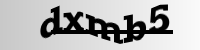

9ex5f


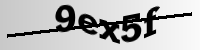

ql1jp


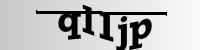

k1bx7


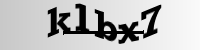

ydb2f


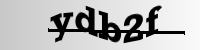

t65mr


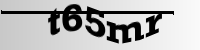

johwb


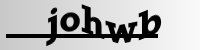

sr8ev


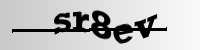

srep2


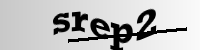

p4u3u


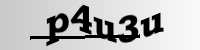

x03ba


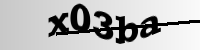

u29md


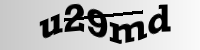

mzjxq


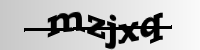

psqnf


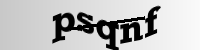

pa2al


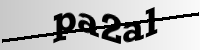

ayl3m


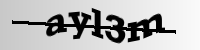

x5115


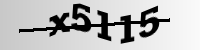

0hpd3


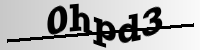

gyqdq


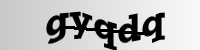

pmkho


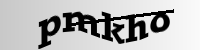

2u2dg


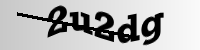

xg2w3


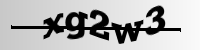

tovrp


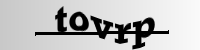

b2ih7


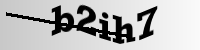

qwf96


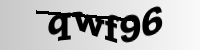

7eq0p


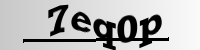

6uar6


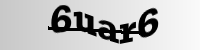

e4998


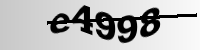

9yzr7


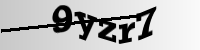

3ftqw


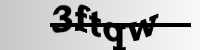

asr6d


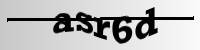

zka9w


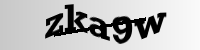

m8qlr


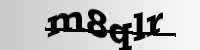

n5mf3


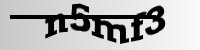

vlxtt


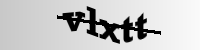

z8rzi


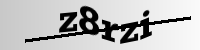

9r6zv


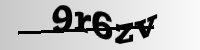

vkku4


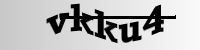

hocp9


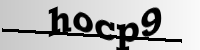

x0cyt


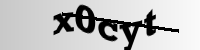

77yt8


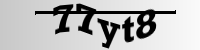

ojffw


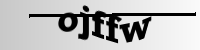

no8or


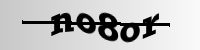

ok00x


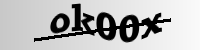

2skaj


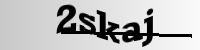

rujpf


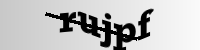

xgkaa


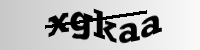

usodl


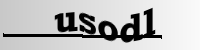

pjtau


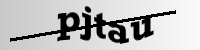

zohbz


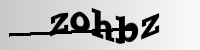

wev44


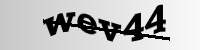

j5tfg


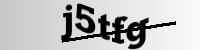

p2got


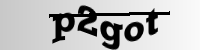

kwkas


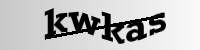

n4w40


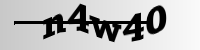

woqm5


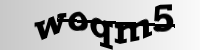

xlcfx


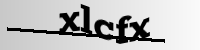

r0oaf


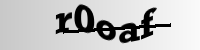

2aql0


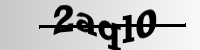

qdzdq


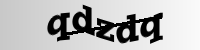

ivy1d


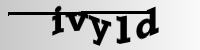

o5hva


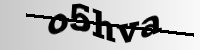

g47wb


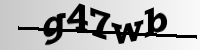

83l1u


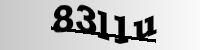

mp91u


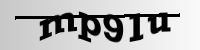

otc4y


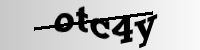

wr7e4


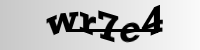

8hs6t


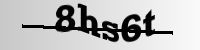

dta5v


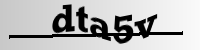

vfduu


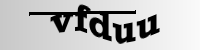

ho5hw


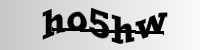

u1j8r


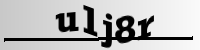

335yp


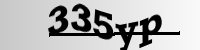

w2pil


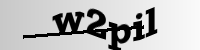

yh6ai


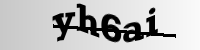

pgjsb


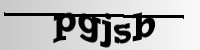

w6c0j


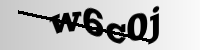

ug95b


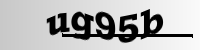

95wq8


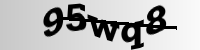

aesr6


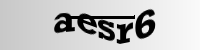

sz3zu


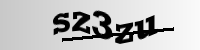

50u19


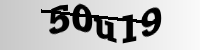

9ywzb


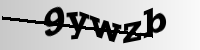

2ab9s


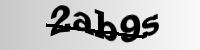

xgcpp


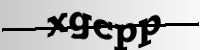

xk8b0


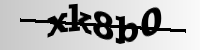

heedx


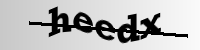

o8rj7


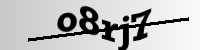

sbd0j


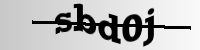

q9dm0


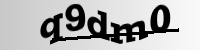

3jncg


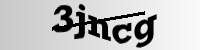

b5b2o


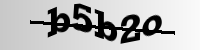

j0v5n


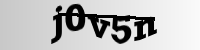

gd6pj


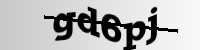

pnwoy


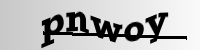

1ejaa


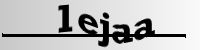

f872k


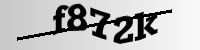

u1mlu


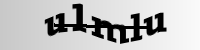

8hzmf


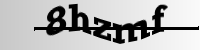

w1ffo


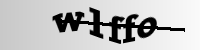

tparr


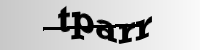

r38w3


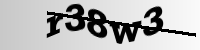

ngk74


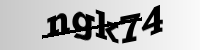

q5ige


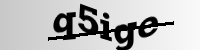

ypggi


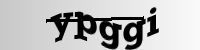

snor3


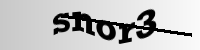

l91mo


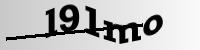

60ud0


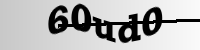

w1l6y


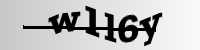

yvdgo


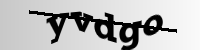

b5r1a


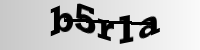

hxwpa


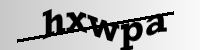

gq487


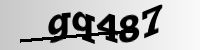

uc18i


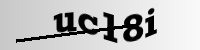

3f31q


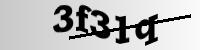

f06zk


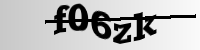

y8rqg


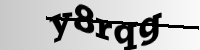

svjur


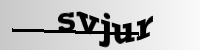

7hxmu


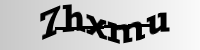

lobyy


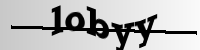

oz5et


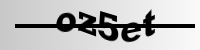

9zedt


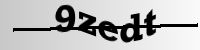

bbvn3


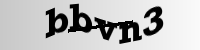

282mm


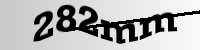

v4wcl


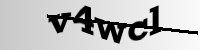

tb4ar


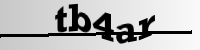

ghak4


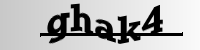

6lvth


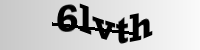

vaq76


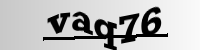

1qndt


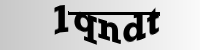

38kss


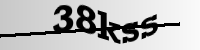

tapnj


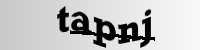

amgdb


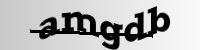

7zy5z


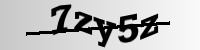

5s3d6


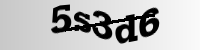

im7ck


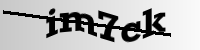

zjhqb


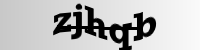

w92dd


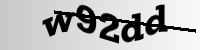

b9o6z


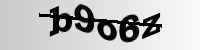

p8exz


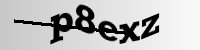

c3hwy


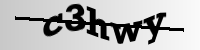

t0hb3


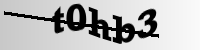

x9b9z


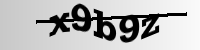

hhtnx


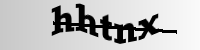

a5s6w


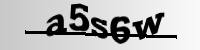

pjpti


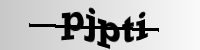

1n30x


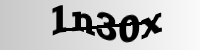

7nqj6


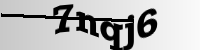

6dz6w


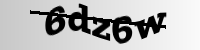

bcunb


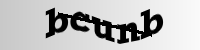

hw4lr


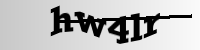

9yhms


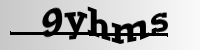

8ys1k


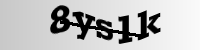

4f2ut


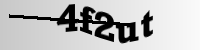

li0nn


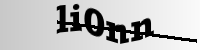

9e5av


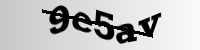

q79y7


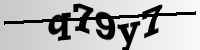

v3y89


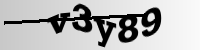

7jacu


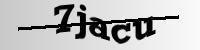

9z10b


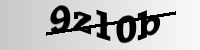

wk290


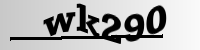

rxkkx


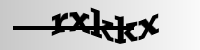

e01xl


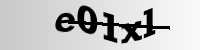

oocfq


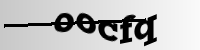

bvus3


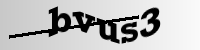

ig3bp


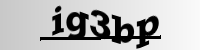

hri50


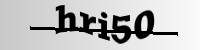

s2mtx


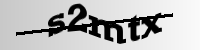

scsop


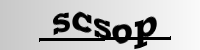

zsgot


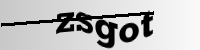

l06r9


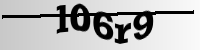

bf2f0


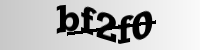

9sjp1


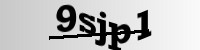

91c0v


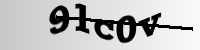

8obzs


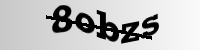

ye5j2


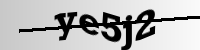

b13jh


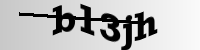

9t7go


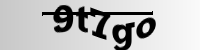

ukjxq


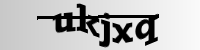

dhh1c


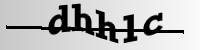

nzp1s


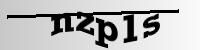

0usmk


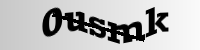

1sxrq


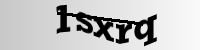

u5oc2


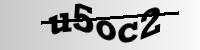

nbr5c


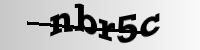

d8vw8


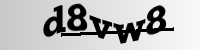

ssuwb


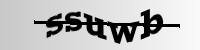

twcnj


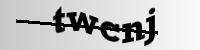

76jlr


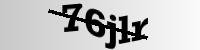

ct1dw


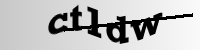

07fdk


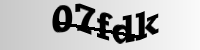

hei5i


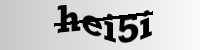

rnx3p


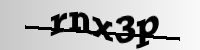

23ftg


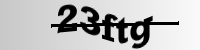

qdvow


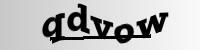

kzsae


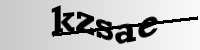

7rbtx


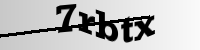

4yo71


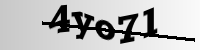

istrg


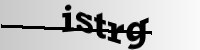

4zzrr


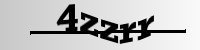

f64sk


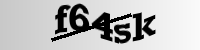

7zudg


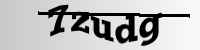

v90v6


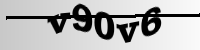

sby3a


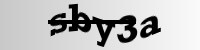

fwn1q


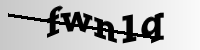

1951c


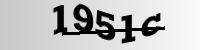

sh2pu


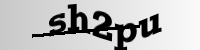

63sij


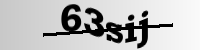

23nh0


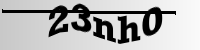

uogkr


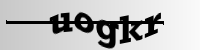

dgi5o


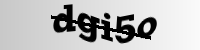

1zmp8


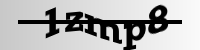

9louf


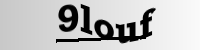

bc5eq


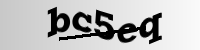

nas6t


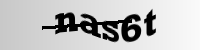

xzvd4


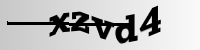

lv6zq


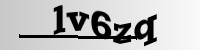

wcwtz


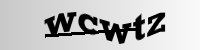

3qs7t


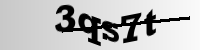

erg1o


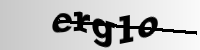

6qi6l


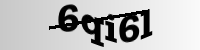

mtd82


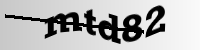

122aj


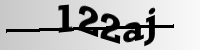

cp6ml


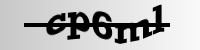

on7xl


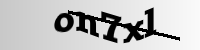

ya5dg


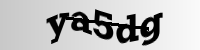

qrmd9


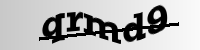

t0of5


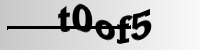

j86po


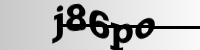

9njfx


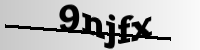

1qpoq


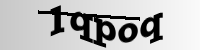

f2odq


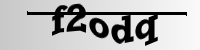

6vn44


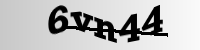

7673c


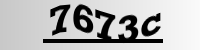

2nq78


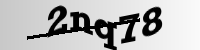

t7r8m


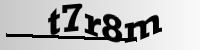

gaoo5


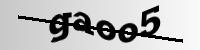

bxv07


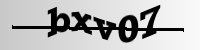

745ho


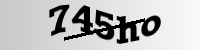

n0aww


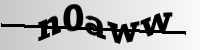

2lesc


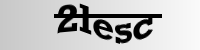

l7iso


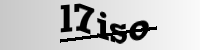

15sos


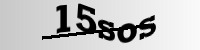

5g7vh


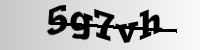

2zact


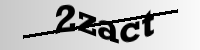

pumzy


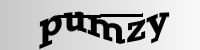

nsndu


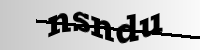

6um0p


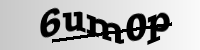

4emsj


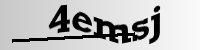

2e3n3


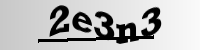

flh8f


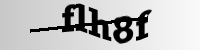

9c34v


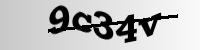

hqm5s


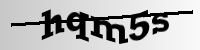

36iay


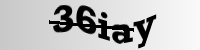

3dyfv


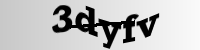

0ak57


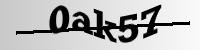

if1jw


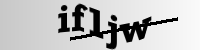

ef5c2


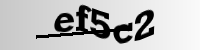

ioacr


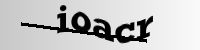

dmrzg


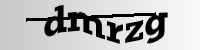

xoyq8


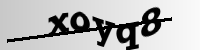

l02uo


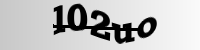

b11wn


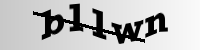

go4r7


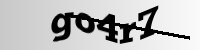

y89sq


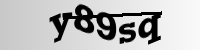

japvy


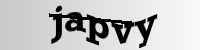

7ldaa


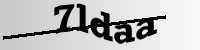

mfqb1


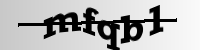

88d3x


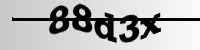

k1nqp


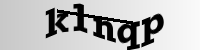

m480q


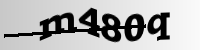

lsk4o


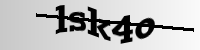

9bhn2


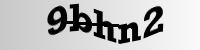

zctp5


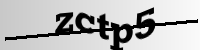

g9pnz


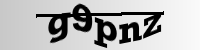

s67fc


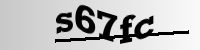

l1fpf


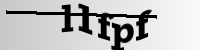

7n2zs


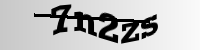

rmqiy


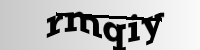

zk8to


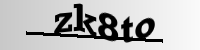

ujhzi


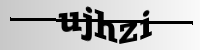

f0r0e


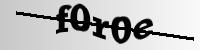

mso8d


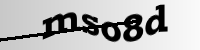

q2qn5


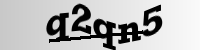

8wwnu


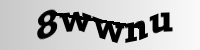

2t1ey


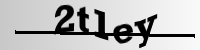

hz8qq


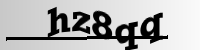

ftkos


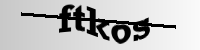

cowqu


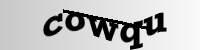

sotuv


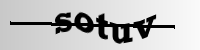

k4spg


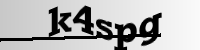

h7knx


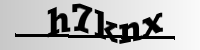

jy7dj


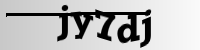

2uakl


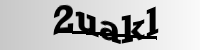

3femk


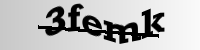

1p8yd


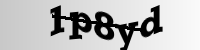

50nhf


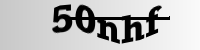

hxdcz


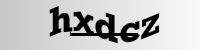

mdsjo


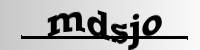

5veiz


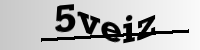

simn2


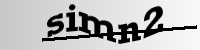

jst5l


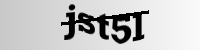

g9kkv


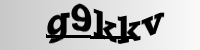

seo68


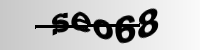

vbrq8


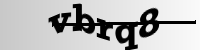

45vj0


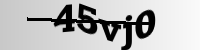

ybml6


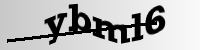

k23ek


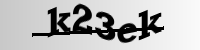

gmcxe


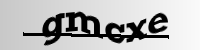

a7vmq


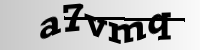

5s01k


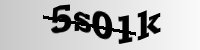

5m1ed


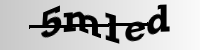

9ce90


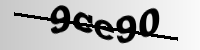

gq3lc


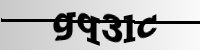

4u6b7


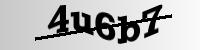

i66up


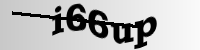

wa66r


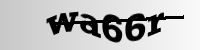

fsfml


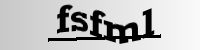

xdcjf


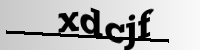

v2k7b


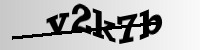

7y7s6


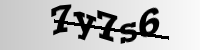

vxb4r


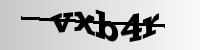

b6s8i


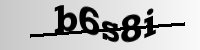

1xvuc


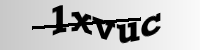

b5nck


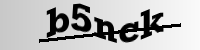

yvgp9


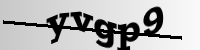

276lp


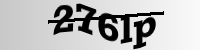

o3h8y


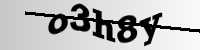

bvaf0


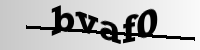

hd5p8


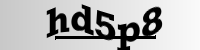

0miee


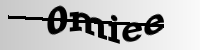

fz8k2


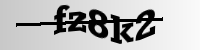

h0a0d


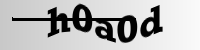

6fjq0


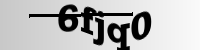

7hp7u


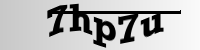

9dkg1


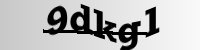

1axy1


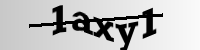

6nydw


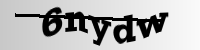

xt9qt


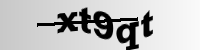

jc8m1


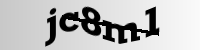

qp2xp


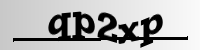

w2rga


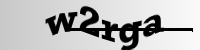

e73iy


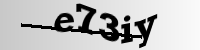

l39uw


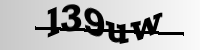

b6r5p


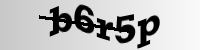

y62r5


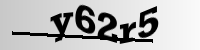

0d0wi


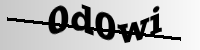

xrj9x


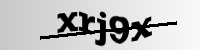

3bcr0


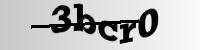

abwpq


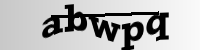

vff4a


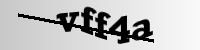

41rdc


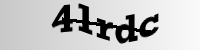

nrjr0


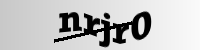

3cgvc


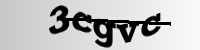

fikmv


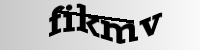

xrcru


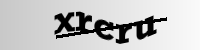

2k6cl


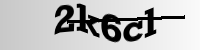

rz7lw


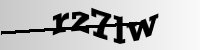

ek3mz


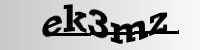

e2vxf


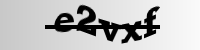

m52ix


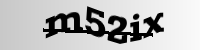

ze03j


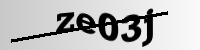

or1ys


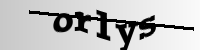

lr6a2


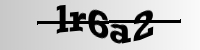

xguhf


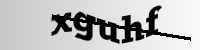

xlsnb


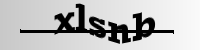

frsbf


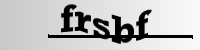

k4rc3


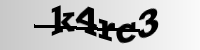

f6b1q


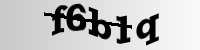

tnxlh


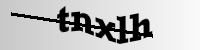

4xlsp


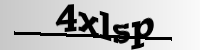

ckzzo


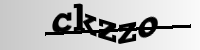

d1kwr


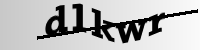

g8opz


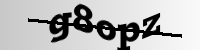

p25uo


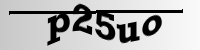

gyamb


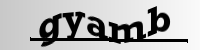

f7uhr


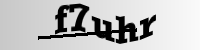

wh80k


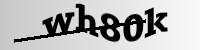

yviys


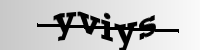

hwzf1


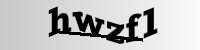

whl5o


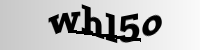

yxczx


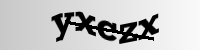

bs00s


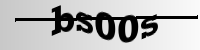

1d6k6


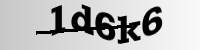

hkqa5


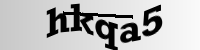

vnfe4


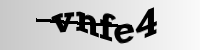

ssqhe


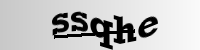

io47i


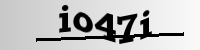

splvd


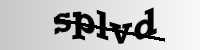

ggcf8


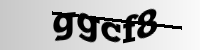

73zhn


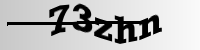

845ve


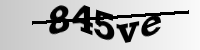

miggi


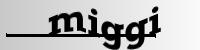

whczr


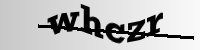

gmauo


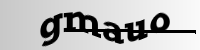

nla98


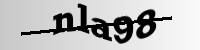

65k3o


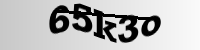

zg6ar


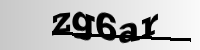

mlisl


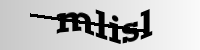

782tq


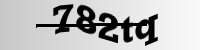

yers3


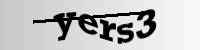

b1cf8


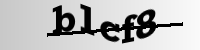

qem2e


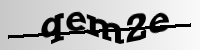

5jr2b


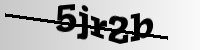

1188d


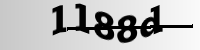

7m58l


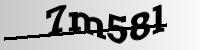

80wop


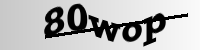

j91dz


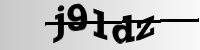

fdlhc


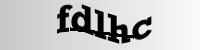

7876u


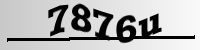

dx0p8


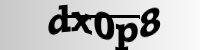

4hra0


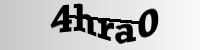

ky9dl


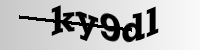

4rthw


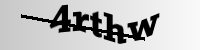

6jd9x


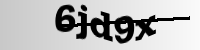

apjv4


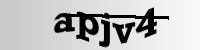

hv6ml


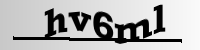

tote1


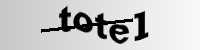

u66is


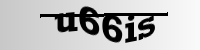

wrfi3


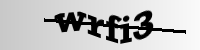

frahv


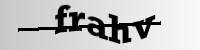

98f1q


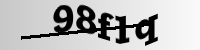

i7hgn


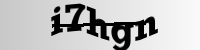

gkumx


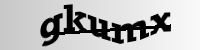

umn3j


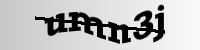

injog


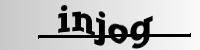

wskhp


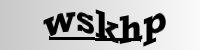

0jhhx


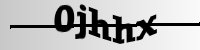

03jo4


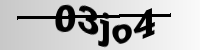

swp6c


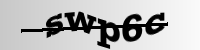

9rshp


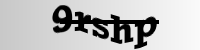

ryef0


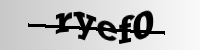

wendl


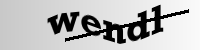

giof7


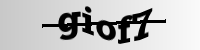

yz6je


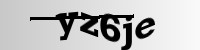

9dnog


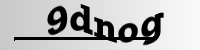

n89d1


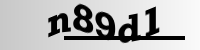

l4nyj


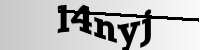

bvj7p


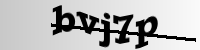

ujh3q


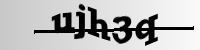

xsbtp


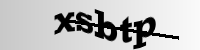

h9e49


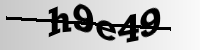

cmo0o


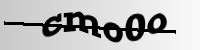

dx0kz


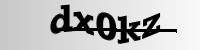

srazt


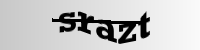

vcjjf


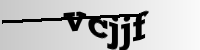

mke5l


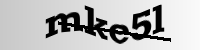

qluap


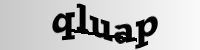

vjp5j


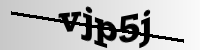

ge1jj


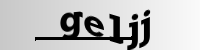

yper5


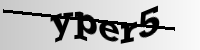

6ftdc


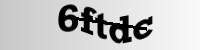

k7g4k


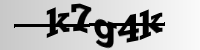

st9u6


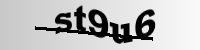

1banh


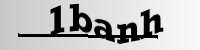

d65pa


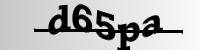

e0lmc


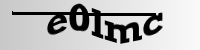

ve9xz


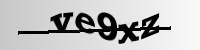

3jfmy


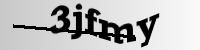

3xznw


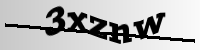

j2awc


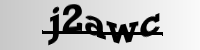

m6u8j


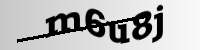

un0ss


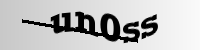

z437b


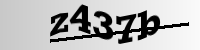

fgldh


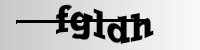

nhoxk


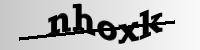

8bs7m


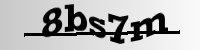

3brbe


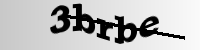

bpzpi


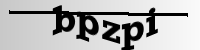

ksliy


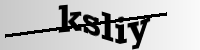

3grd6


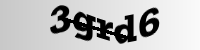

8tl0h


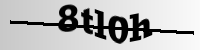

n5tvs


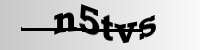

zd5ch


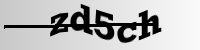

1p10r


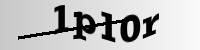

rz22w


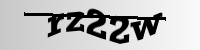

aghfg


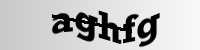

b2cc5


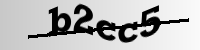

vwazg


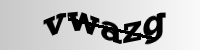

556f2


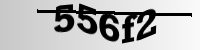

ydkyh


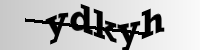

06912


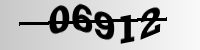

hmv4g


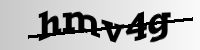

kjqj4


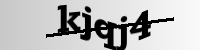

q0g3d


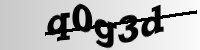

7s57m


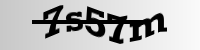

pp5gq


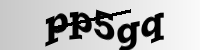

yq1y9


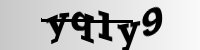

21nd5


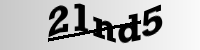

le40c


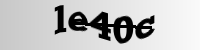

05o45


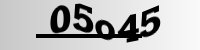

82y8p


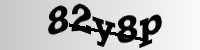

slhno


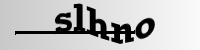

xlsb9


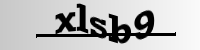

p82wd


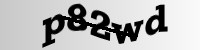

hlmek


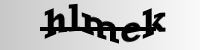

v8jhf


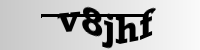

e54ym


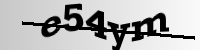

ie0my


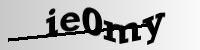

uavpb


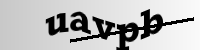

4d1q6


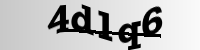

i3gfw


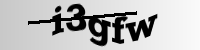

0qcju


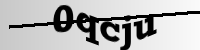

ed027


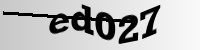

7767s


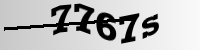

t20fh


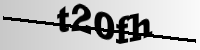

yzdeb


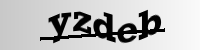

lf4px


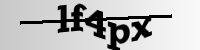

ymxtz


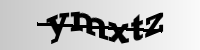

n923q


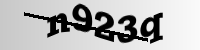

301oi


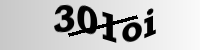

zlf50


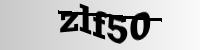

48yoh


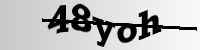

05nzx


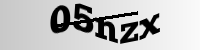

onkkn


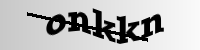

xrzex


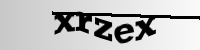

k4qww


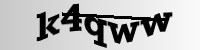

mj6yn


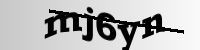

rn2lw


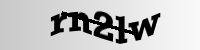

9c9mi


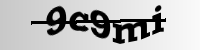

92mln


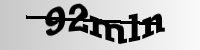

j8fy7


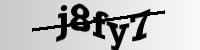

rp6a4


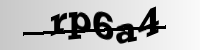

1iww7


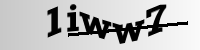

y3e8m


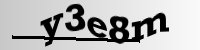

2c267


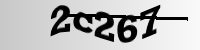

tp8sf


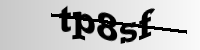

krhf6


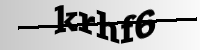

cn1yl


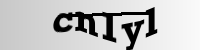

yxsjf


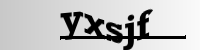

mv7sn


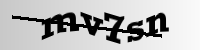

m48ir


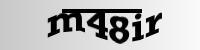

gxmch


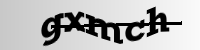

83mmm


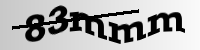

1xwdg


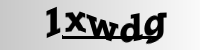

2fyhu


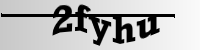

519ge


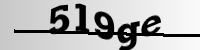

yvrff


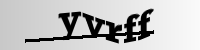

jkq08


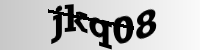

ircjz


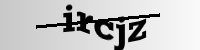

i2kkf


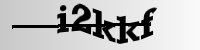

48ltc


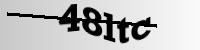

9q3we


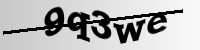

gyi13


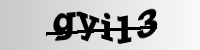

ojm0d


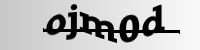

krcsq


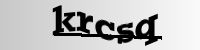

h4hq3


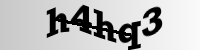

nsy46


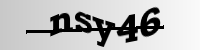

c2y5o


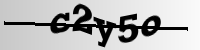

6p1jo


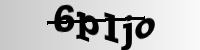

rf6li


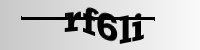

hne1j


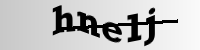

lfqg3


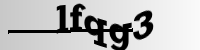

3cun8


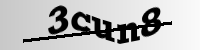

c8xe6


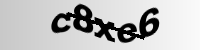

5t74y


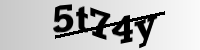

gftso


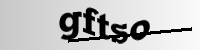

hrm3e


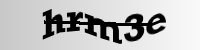

pl80e


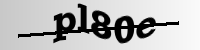

23jzv


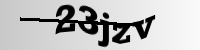

hdoa4


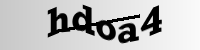

y3nmj


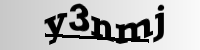

n5anc


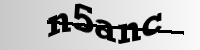

cq4db


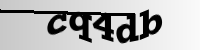

2bb8b


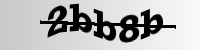

jq120


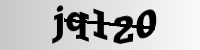

5s0a9


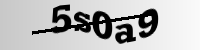

omdc7


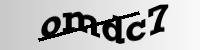

dsqn3


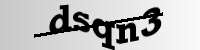

pj283


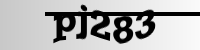

w65d2


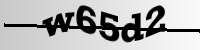

pr1fp


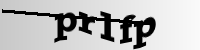

tzztx


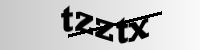

orfy5


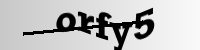

lc7h1


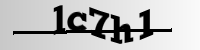

45qc1


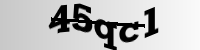

3ycax


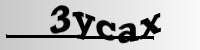

hmdvd


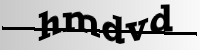

pjf1t


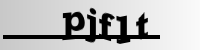

7a0fq


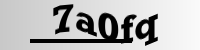

xmco6


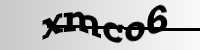

1y52j


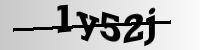

7xiau


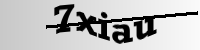

hsdq8


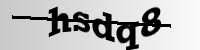

fxwqe


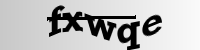

vi33p


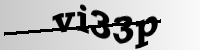

d09qy


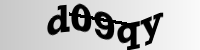

nygaj


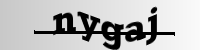

t50vb


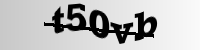

is4k1


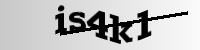

s0l3m


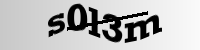

u4w7i


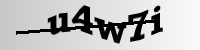

ja6n5


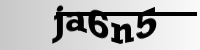

qll3a


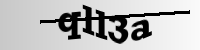

00c76


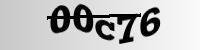

9a0mr


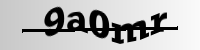

9wpqi


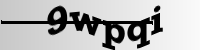

k1bnk


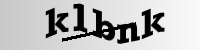

eow04


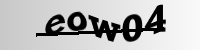

hgpzf


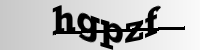

qqb32


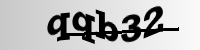

wlee9


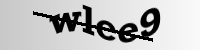

xvodp


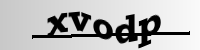

gx06g


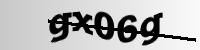

lewux


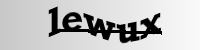

etnjw


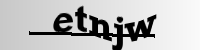

6x898


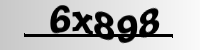

619as


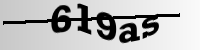

he98t


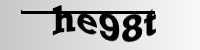

ol03l


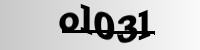

p45w7


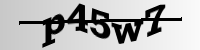

kx5lw


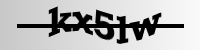

ctjo9


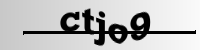

wriv8


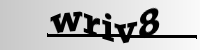

hllg2


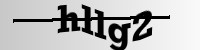

jr99e


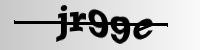

srl5e


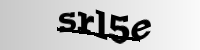

dlt7h


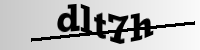

yhwfn


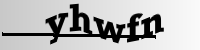

p6u6a


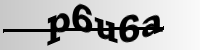

jcv75


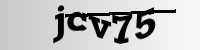

6seko


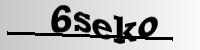

sglvw


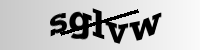

jj751


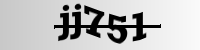

obk3p


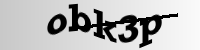

hm6vl


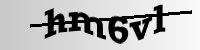

cvodo


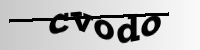

50lau


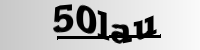

dv52p


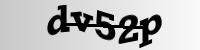

wojz3


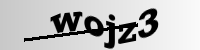

063r8


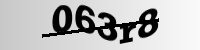

0dtuz


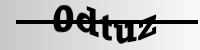

503h9


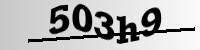

o5wvq


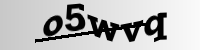

7jzsd


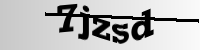

f1v6w


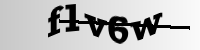

9t8ix


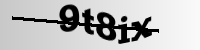

qgusz


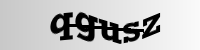

65mn7


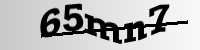

1s62n


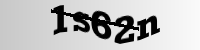

btcyz


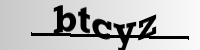

21whu


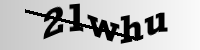

3pjxu


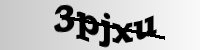

18x96


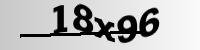

vvaiq


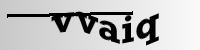

ij4il


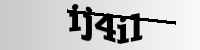

hooik


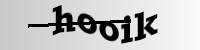

gmms1


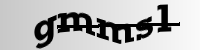

ohcot


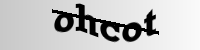

cwzrb


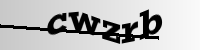

tesuo


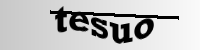

9ou75


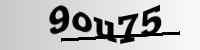

w62s7


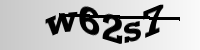

hdpph


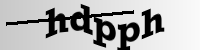

u405d


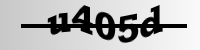

5suy5


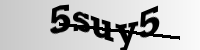

ua2jh


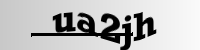

995ey


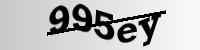

3v1kf


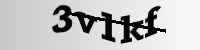

nvm0p


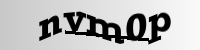

qo8yg


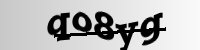

yq8lg


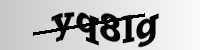

2sudf


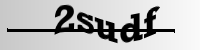

ntart


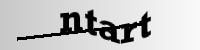

j6bs8


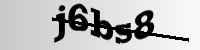

ykfks


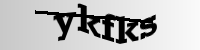

mtqps


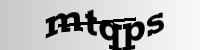

vy1y4


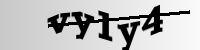

xbdq2


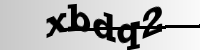

lnhf9


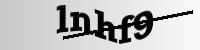

uvmin


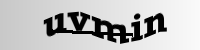

5qqn8


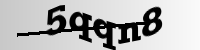

4i38e


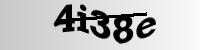

9s5ra


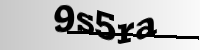

i1vi9


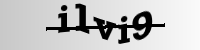

mb1ib


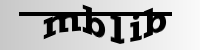

6hb0k


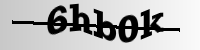

95hps


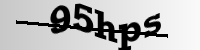

vk6vq


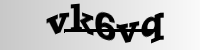

fvj2j


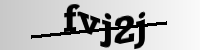

ztgga


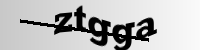

5df3l


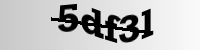

393qz


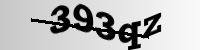

zzkvc


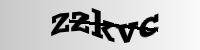

n6mu6


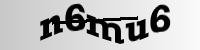

67t3x


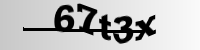

3pozi


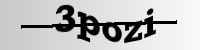

6xhj8


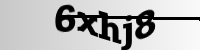

lh8ej


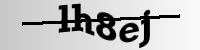

r76e1


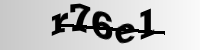

2rdm5


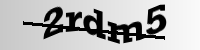

ehpyl


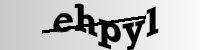

hg148


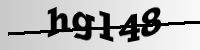

e0k4i


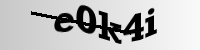

9oiaf


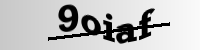

5mpj0


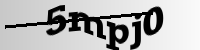

mjp5c


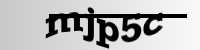

nqc01


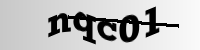

oesdj


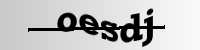

ow8o5


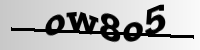

7i2ma


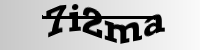

g24gr


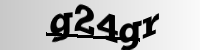

47s7r


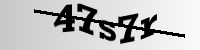

5mgjr


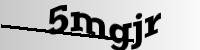

8lygk


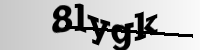

qm9ey


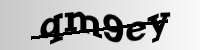

b72ch


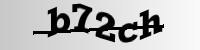

bqmrh


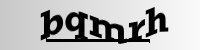

gq4xr


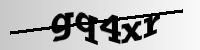

z44et


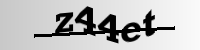

65s2e


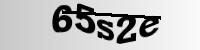

bpq91


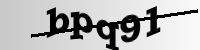

4sx2i


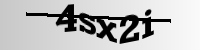

mt2fa


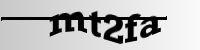

5vru7


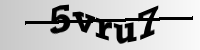

impy9


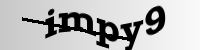

s14ri


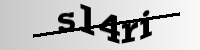

mo8ht


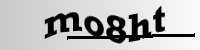

ps24q


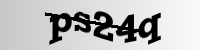

cp0ur


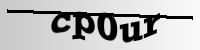

9y8bp


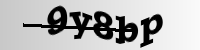

izf09


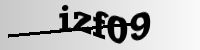

iule4


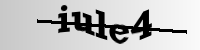

vro8b


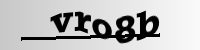

uod2h


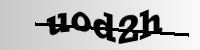

46x3g


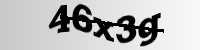

emqvi


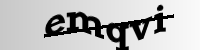

6tbqn


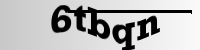

k0deq


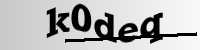

l63uh


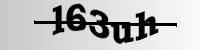

g24s2


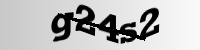

8w2im


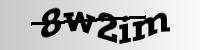

xnr1a


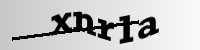

g11f3


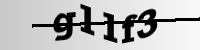

1bv4l


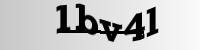

8fy3q


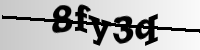

ayprv


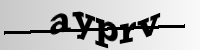

ecwi4


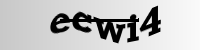

1umi3


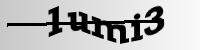

6sy2r


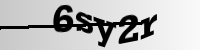

14s17


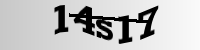

u684b


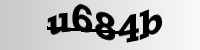

8xiqq


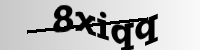

zzx7q


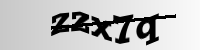

ijnyh


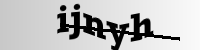

89p2q


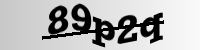

6awc9


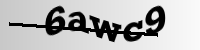

byl47


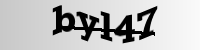

5vcqm


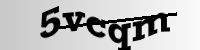

mlec0


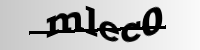

i5gzn


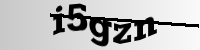

5w3ce


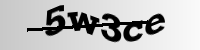

c0xcc


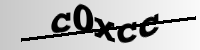

64ypn


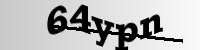

p32ql


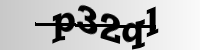

lil12


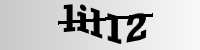

6npfj


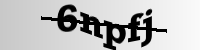

pxnb6


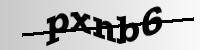

bmcz3


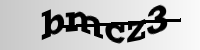

k247y


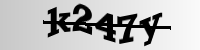

2mqlq


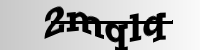

ebwcd


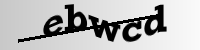

coj6a


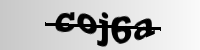

z4a8l


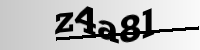

wdxix


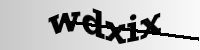

6fnwj


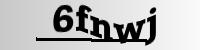

69rsy


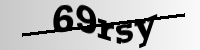

sh7uj


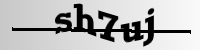

iti2x


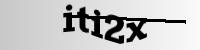

yn4xk


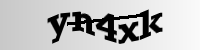

gxm8u


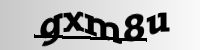

c38p3


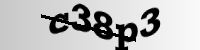

6xrsi


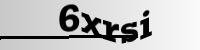

fblti


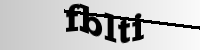

g1s1w


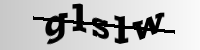

k206l


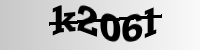

7dmqh


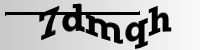

svrn9


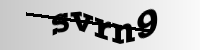

ujb6t


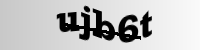

ofdd4


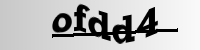

zp563


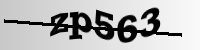

5o2ku


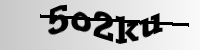

1316b


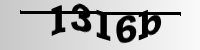

rdt83


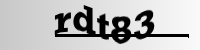

ffh3p


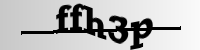

8hdbx


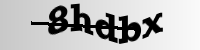

9hqw0


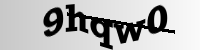

t0er0


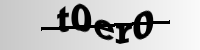

b438e


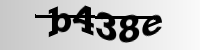

eiaad


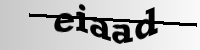

g3ke2


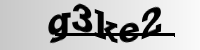

p6w44


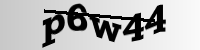

unyea


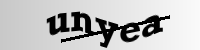

p15qj


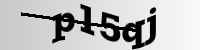

psqsh


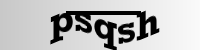

313ei


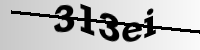

l3dz9


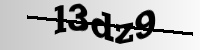

szpbe


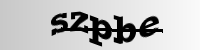

h8sms


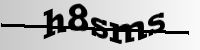

15jua


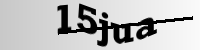

qho33


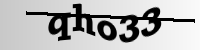

r6u8k


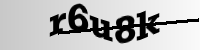

r0py8


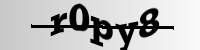

kgfwm


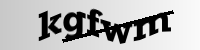

l10u9


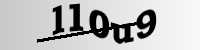

lli6b


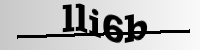

ola54


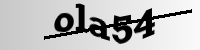

xh6m4


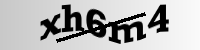

hnove


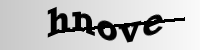

p7ngl


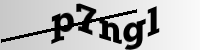

re1tm


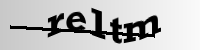

sgl2f


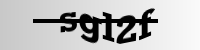

0ri1s


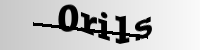

9wor7


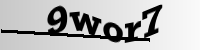

k6w0j


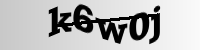

xfg3g


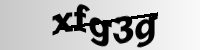

y3syb


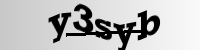

i4gst


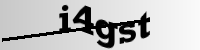

mjgao


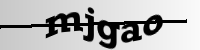

ltiww


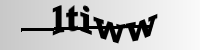

a7dnx


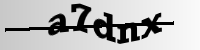

4d0cv


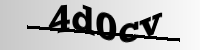

qyvyd


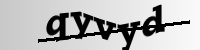

5ujkv


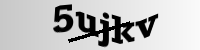

8b7vm


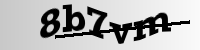

sumrk


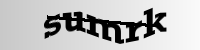

3sbpo


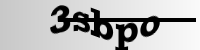

1rf90


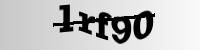

smd9u


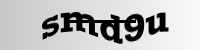

gpqsh


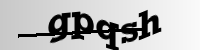

uxve4


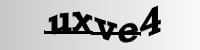

ervg9


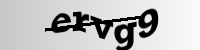

uludr


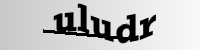

3lupt


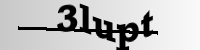

0khil


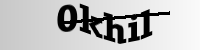

cjkgc


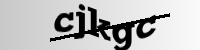

sqhym


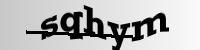

1vb6y


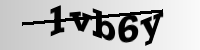

celbc


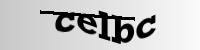

qxmbs


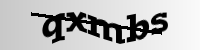

3pw03


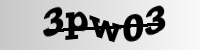

iwv2e


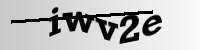

5ffyq


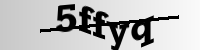

kkw49


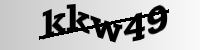

qrg99


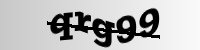

ukiwy


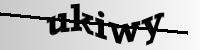

1n54n


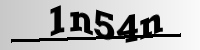

7qf75


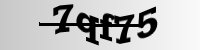

pvuyo


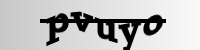

iy0zv


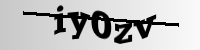

l4d3a


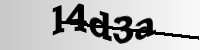

9o2iw


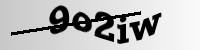

o1o3w


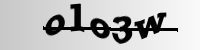

zax5l


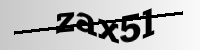

qp9kx


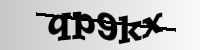

fdbym


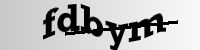

qa28v


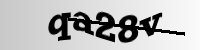

j1f5j


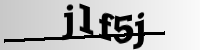

qsfza


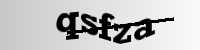

rzhub


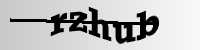

d4fo4


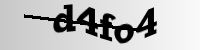

6vgfx


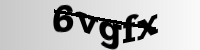

jgk2x


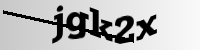

hyopt


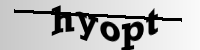

v46o9


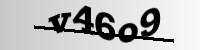

85cy1


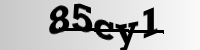

l57u0


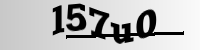

i39t6


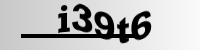

2s0ep


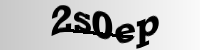

judaj


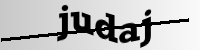

d1fo7


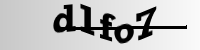

a1xbf


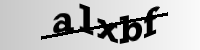

veleo


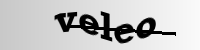

yfgch


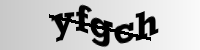

ndq16


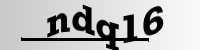

0jqwy


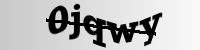

abqw5


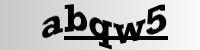

hxxpg


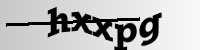

wbl8d


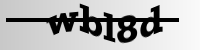

q7a4g


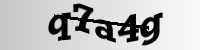

ju95a


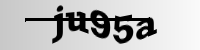

2exae


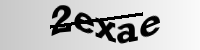

fwjc5


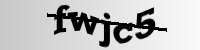

zf2wv


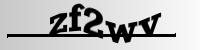

56710


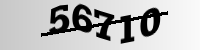

9d16t


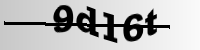

r4ed6


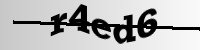

rx7lq


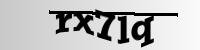

y4ua7


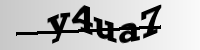

jde56


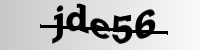

y15hp


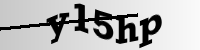

lkj3m


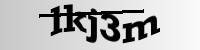

j5mhi


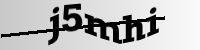

76nty


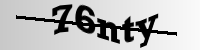

h3pbc


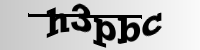

yubmf


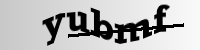

ejjfo


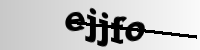

o1jaw


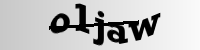

i6alv


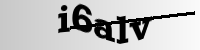

8gk3j


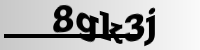

q0u4v


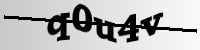

vha91


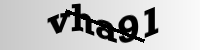

p0s76


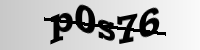

yx56v


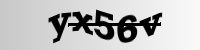

q58lk


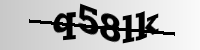

1frxy


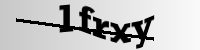

yxnwj


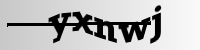

r24ds


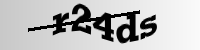

899ak


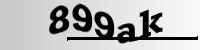

qstl2


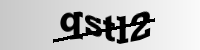

vhyun


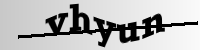

p4ldg


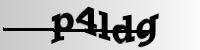

x9qbz


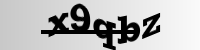

g0auf


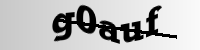

vcqtv


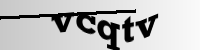

hq2ee


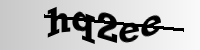

syycl


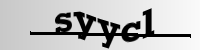

shzed


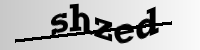

dl61r


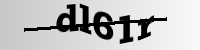

x99v1


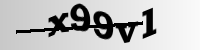

00tuz


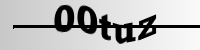

42wt0


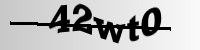

r0noe


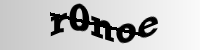

pchor


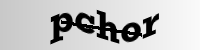

01tts


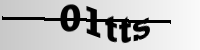

lvpit


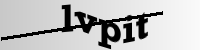

nddzy


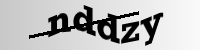

jsut5


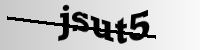

4ilpq


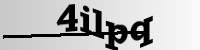

wfloh


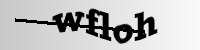

6x1r2


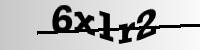

g4osm


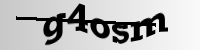

5gszl


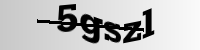

rjmjt


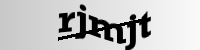

rcwgn


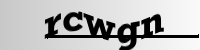

7btez


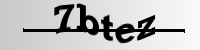

epoqd


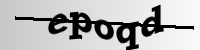

ufu6a


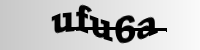

9300i


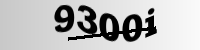

ge0dh


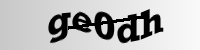

95u1t


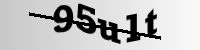

i0399


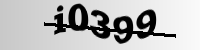

gxla3


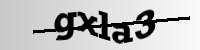

iso58


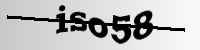

xa1tn


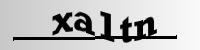

qx8i3


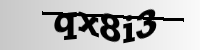

nimsj


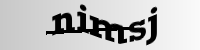

a2pf1


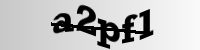

9vhdg


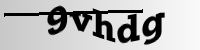

dry9e


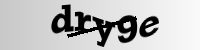

sn2rj


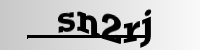

0h424


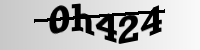

nd3ib


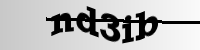

ve5f7


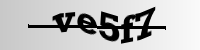

b2w97


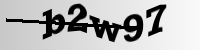

ovspb


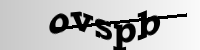

zkcmx


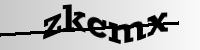

o2i7e


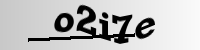

rb69r


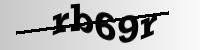

p2gxj


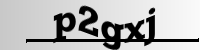

d95d7


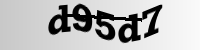

vb56k


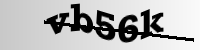

8tlp2


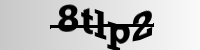

kzstm


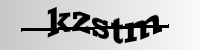

w7ddj


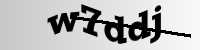

at2z1


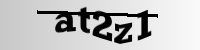

m512i


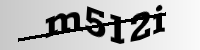

pv6kz


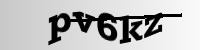

aykme


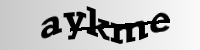

x0d28


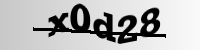

kpqfd


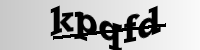

slk7q


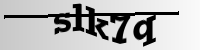

7ulay


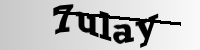

yjpgw


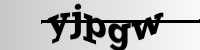

943qb


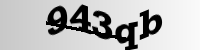

m4ob0


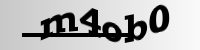

6e6jv


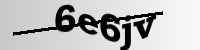

k7wqb


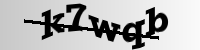

uj7sw


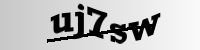

44mg2


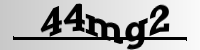

1s507


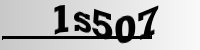

3rj5n


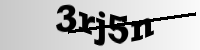

kvoix


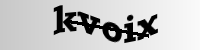

7eryo


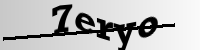

gzsm2


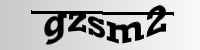

wk6re


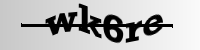

16cr2


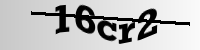

5o5h9


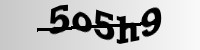

ufrir


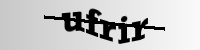

nzpgs


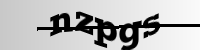

xtx73


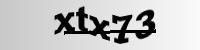

9z4fa


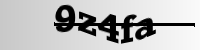

cr07m


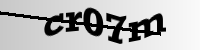

rwcrn


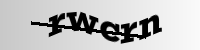

pnsac


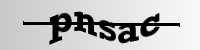

8c2wf


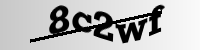

qas2z


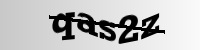

3p3kb


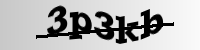

6pn99


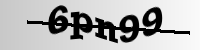

2hqoj


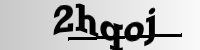

9a6t4


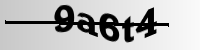

anqt0


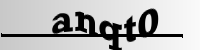

6kqn0


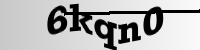

p4bgg


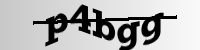

xn8re


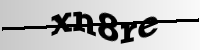

06uxu


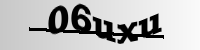

t77za


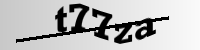

bzdtm


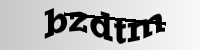

td429


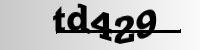

23utq


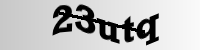

zp42i


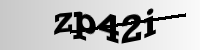

wqmqd


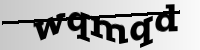

41nw4


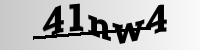

gbu4s


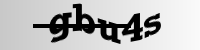

bihse


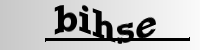

8spir


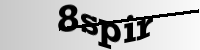

jrtb8


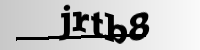

nvyb0


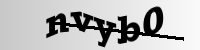

3cvig


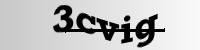

3jm4t


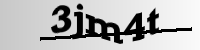

wqz88


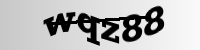

zsyfx


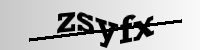

bym9j


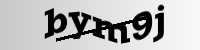

bitux


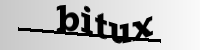

mp84k


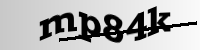

sr5s7


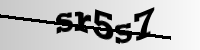

qxidu


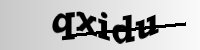

zh6sh


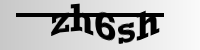

1pekq


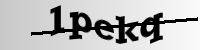

z81ur


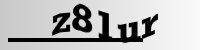

g4g47


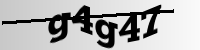

w3x4p


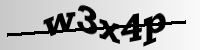

qg5u6


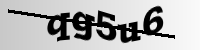

3xyr7


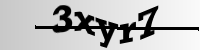

kzrnk


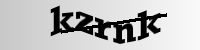

cteqh


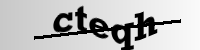

i2wt9


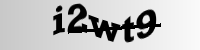

uau6i


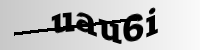

8tnmz


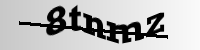

ss6c2


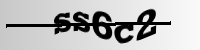

msg66


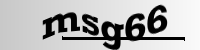

iq5w8


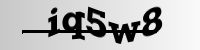

x533x


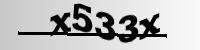

ft92j


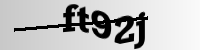

pp8xx


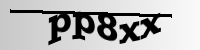

20227


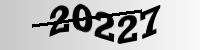

u8llo


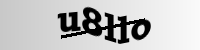

6py82


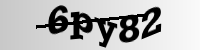

77uh4


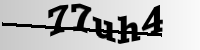

trl3b


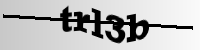

gwm7x


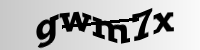

5uoiz


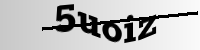

sct0w


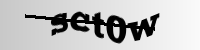

p0j7x


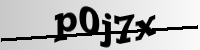

rb6o5


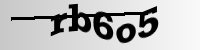

9dqai


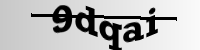

toi32


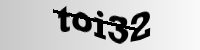

w9tnb


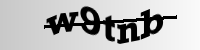

m7bfp


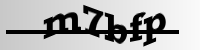

rt547


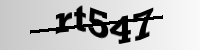

fslw9


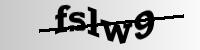

mqd0u


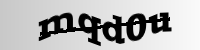

606at


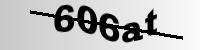

c386q


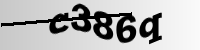

6e1jk


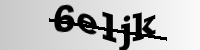

e0pzp


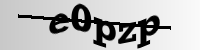

30ysh


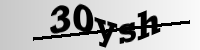

1i0y9


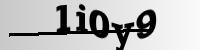

o6ha9


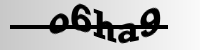

ky898


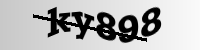

q4e25


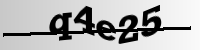

mqoh6


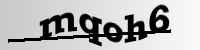

d9jfp


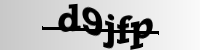

gqil9


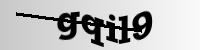

501xy


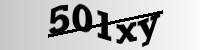

vigmo


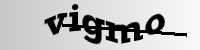

rcq5a


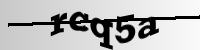

gxl0c


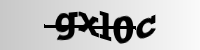

haf7n


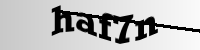

2cdx1


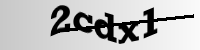

fujmp


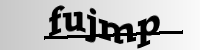

144v5


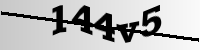

kca10


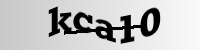

78gt7


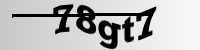

q3tcb


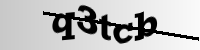

esw08


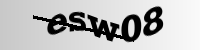

kpiy7


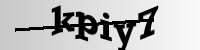

4p7d4


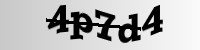

ee286


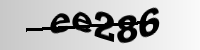

wqz73


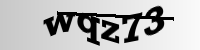

36h43


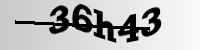

ew9jc


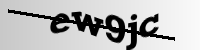

1mt9b


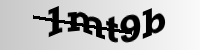

wkrut


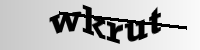

341qa


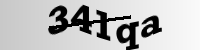

5ivdh


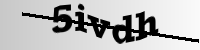

o30bj


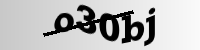

lp872


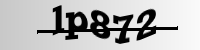

mfrbl


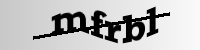

9pc5u


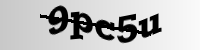

kpvmq


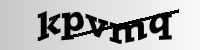

pcp12


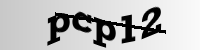

05p6u


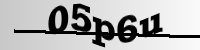

r58o0


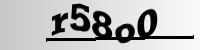

wehi5


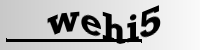

ymg7t


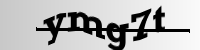

nzkcm


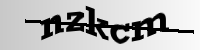

q0eix


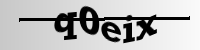

ekrk5


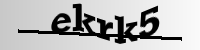

8e485


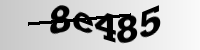

ori5g


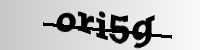

4qimu


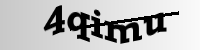

7dcp3


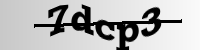

p4b1y


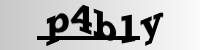

qyzd3


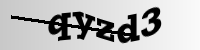

p9bvp


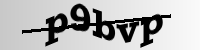

a8tlj


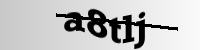

b968w


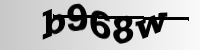

5h69c


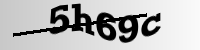

9ga2q


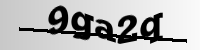

289mm


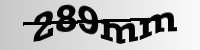

f1ct1


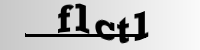

ro6dp


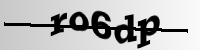

md2ym


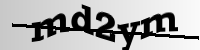

f7n2g


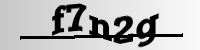

v358h


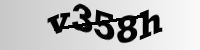

yv3bd


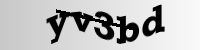

a80ox


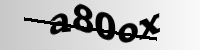

b5s48


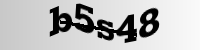

fv465


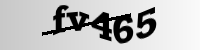

gcnko


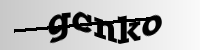

i2mmw


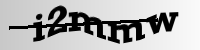

ucc45


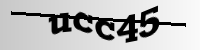

u46f4


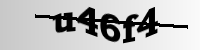

jzxja


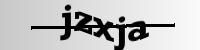

6rjxp


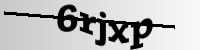

lal6w


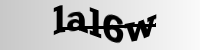

a5yxa


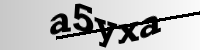

01r3w


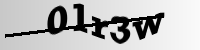

529lt


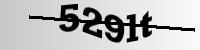

7t7j8


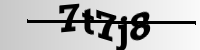

e8bkc


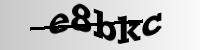

y9i69


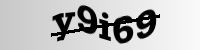

vo5g5


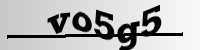

xe943


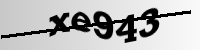

e0ptt


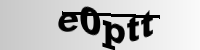

11fqs


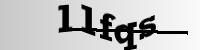

5phlb


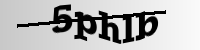

tqj35


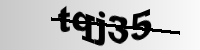

4bexk


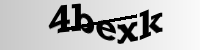

yof39


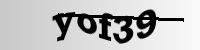

36d6l


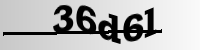

ocx2o


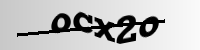

4khry


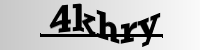

rdsb3


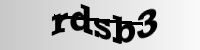

p72q9


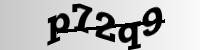

eqwva


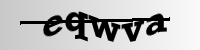

zegpb


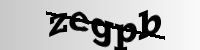

161kb


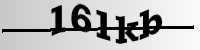

1eyqw


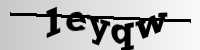

8n3ow


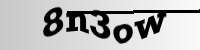

hco5m


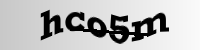

2br65


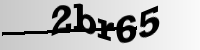

j56qh


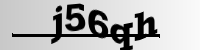

jzk4e


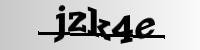

cmc82


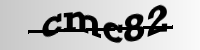

qwfjv


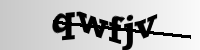

m9bsj


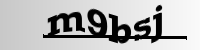

kiazu


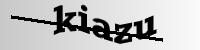

fe23l


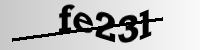

gsp3w


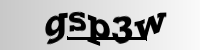

9d9of


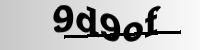

fhu9c


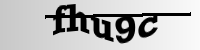

5use4


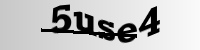

vsuk0


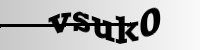

ntrcj


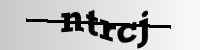

4w4yw


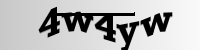

vwkb0


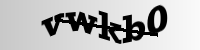

22vhd


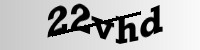

eabhb


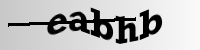

hmqtx


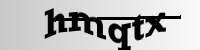

o8s13


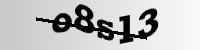

de8rn


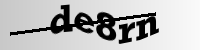

c0tb5


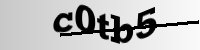

afhyn


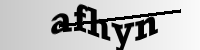

dpduq


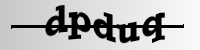

sjwrd


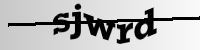

c8ryj


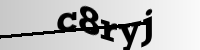

qhlfg


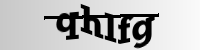

gzgkr


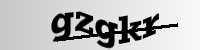

w9az1


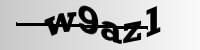

qo878


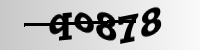

9dmaz


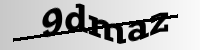

40m4u


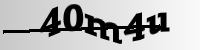

l8p7z


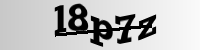

k0k3h


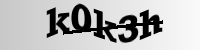

887cr


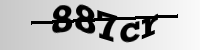

mhz2w


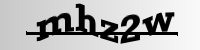

qb9lt


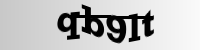

na3kr


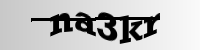

ncdbi


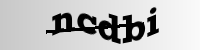

v3rqh


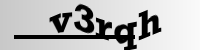

eou9k


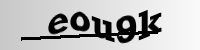

shobd


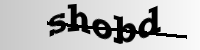

in7q4


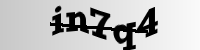

rfudq


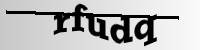

zuau5


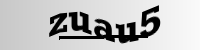

sifor


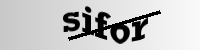

vi15x


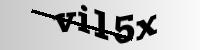

hkfwl


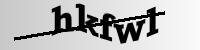

pfm0g


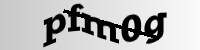

6a7nh


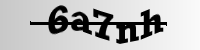

29xb1


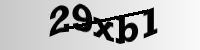

7bt9d


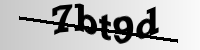

0j0j1


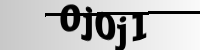

z8nkf


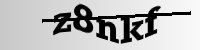

vasmd


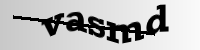

fw4q0


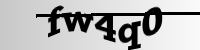

ms6yh


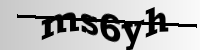

qu1ij


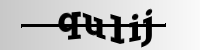

02uqu


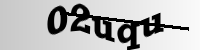

5vqaw


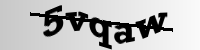

inb71


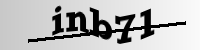

3fh37


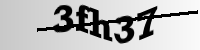

lbs16


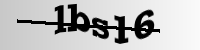

4iqae


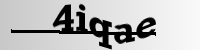

6kx1m


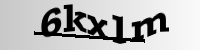

bbhf3


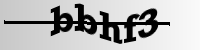

0niz9


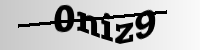

esopl


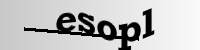

gp22y


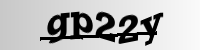

kc81j


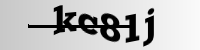

81g76


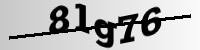

ilhre


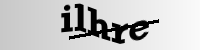

7vqvk


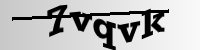

ebter


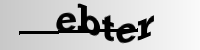

tln5t


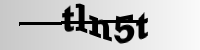

no81m


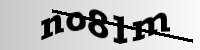

ybyt6


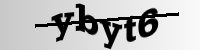

dh4e4


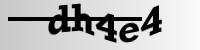

0u2q7


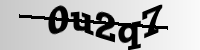

5f2de


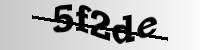

w4j7o


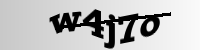

zam58


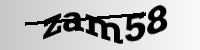

006w6


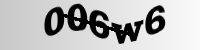

ethpc


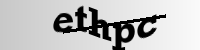

r4m4q


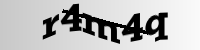

crhj5


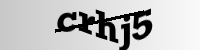

y99x0


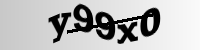

yilmf


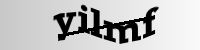

ko0nv


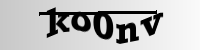

sbjjs


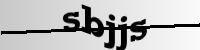

nyrcs


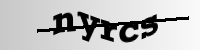

54fbk


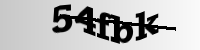

j88v1


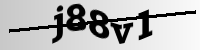

b6ok7


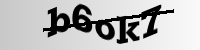

exg50


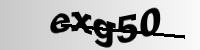

hwh6m


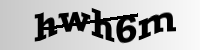

9rr86


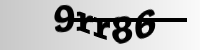

ag7yt


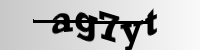

xowu4


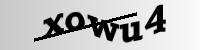

81q63


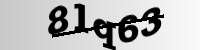

orep8


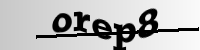

j3x6l


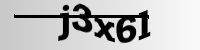

jgs2t


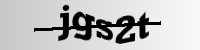

e5rr5


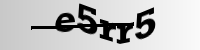

qocik


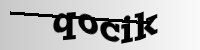

qu1bu


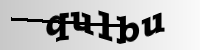

2pftl


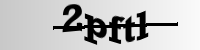

4nij0


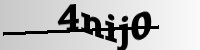

odrdl


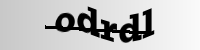

1dqwz


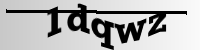

rczbl


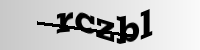

k5v2d


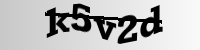

suclc


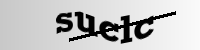

tdbc5


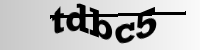

ubuy5


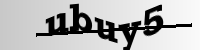

qucs4


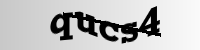

miklr


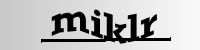

k31ud


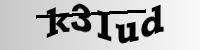

9aeex


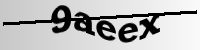

xu355


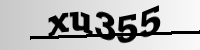

6eq81


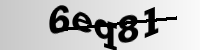

egw35


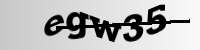

e0z5u


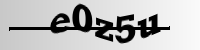

g1vqz


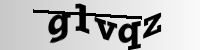

flqnc


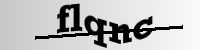

344tl


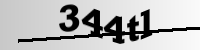

gg1q8


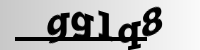

bcx4z


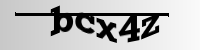

ql0x1


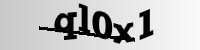

61hsp


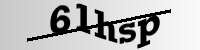

teg2e


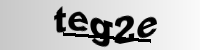

uei2i


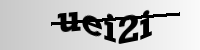

meyrg


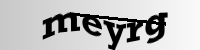

6tkvn


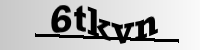

ruinx


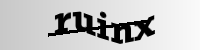

7t2ej


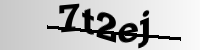

knx4g


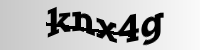

fmuos


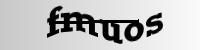

vwwgf


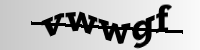

gmke3


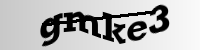

02pig


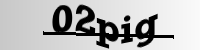

gw2zb


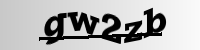

mzdma


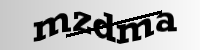

z1znh


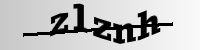

n2my2


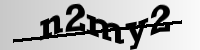

ga7c4


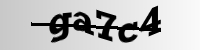

0rtoh


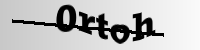

zokp9


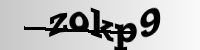

0hvu9


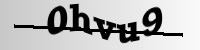

twmpl


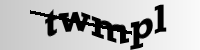

bx564


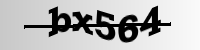

19sgh


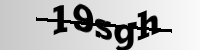

t7xj1


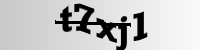

56pli


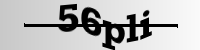

meytv


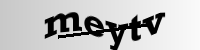

8scxs


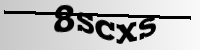

wg3wa


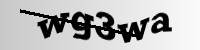

86r8p


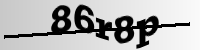

9b1qw


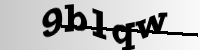

r38co


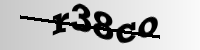

87i81


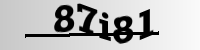

m0nf0


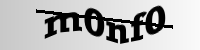

pafdq


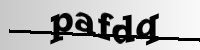

hcqe2


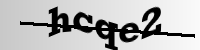

5744n


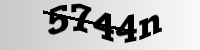

9u6vb


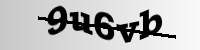

e1tdu


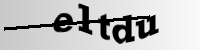

80abv


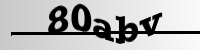

yrfcg


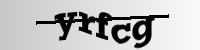

cq8kh


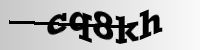

j0cpl


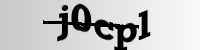

560c7


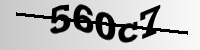

i8m3x


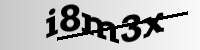

t0mbh


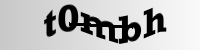

ztn93


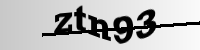

itpig


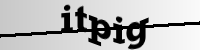

6d82j


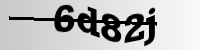

xi0lt


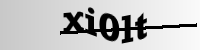

85e22


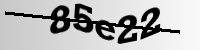

a9yl0


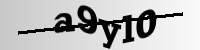

06knr


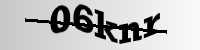

z697m


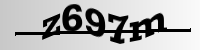

1jk0i


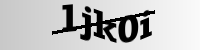

kk03w


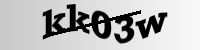

16kv6


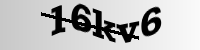

lebn6


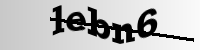

8qn0b


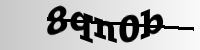

7bis2


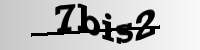

mitre


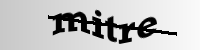

8eks2


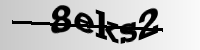

bu6kq


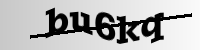

fi76r


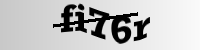

m0a1q


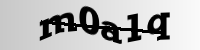

0bsoa


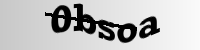

fsfum


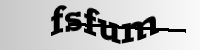

0ujy4


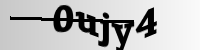

68sej


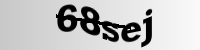

ssd4m


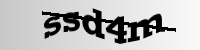

uvbvm


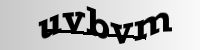

vv09h


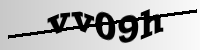

ya1p4


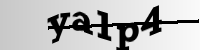

hhzmh


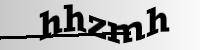

uh7gu


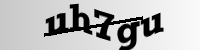

k59zt


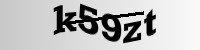

uowf2


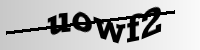

kavaz


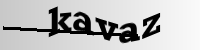

lxvgh


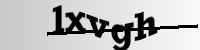

nu7m4


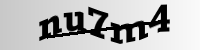

v2tfk


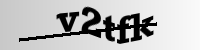

8anvj


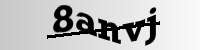

sw4j8


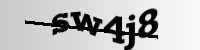

stp0u


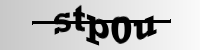

t2yvp


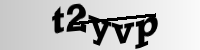

tiqi8


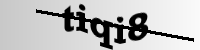

tt27q


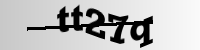

li8jg


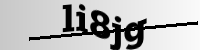

ffiyv


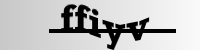

70jq5


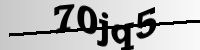

33blx


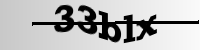

hk0ul


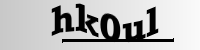

x052x


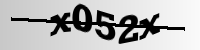

oobg7


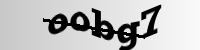

5hbah


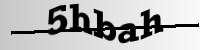

1c1ma


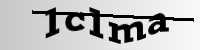

kuzjf


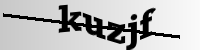

7auoq


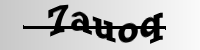

a62pt


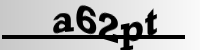

gu2t2


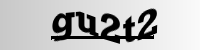

81ben


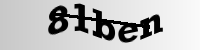

fusap


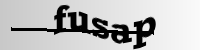

rzl6r


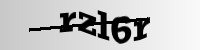

7q2tq


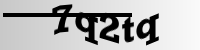

8cu01


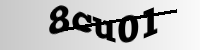

z4862


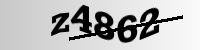

z461p


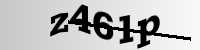

wmbg3


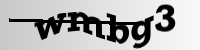

uqzae


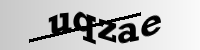

hbavd


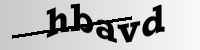

m0qbw


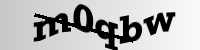

xx4ec


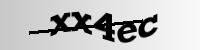

134jv


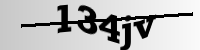

5gzu2


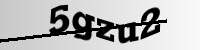

vjcvt


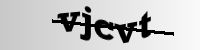

h8lhm


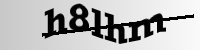

z1fiq


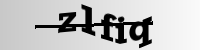

96wy8


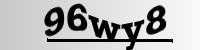

ebdls


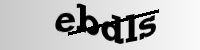

uxtnc


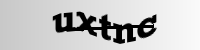

vep17


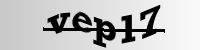

n04uz


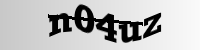

ibo8j


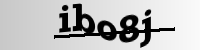

4omz1


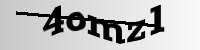

irfc6


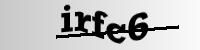

z3v29


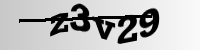

caqc6


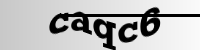

scscg


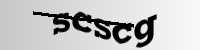

kca6e


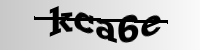

x2672


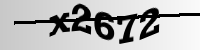

uam6u


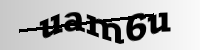

8g3fk


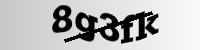

t80bq


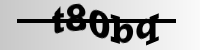

352a0


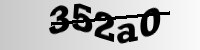

fludb


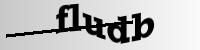

rydz1


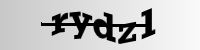

mtuey


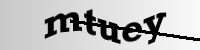

cwngf


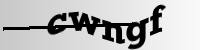

23iyh


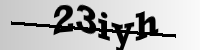

4hfgh


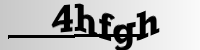

yub2n


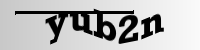

bwdui


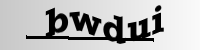

nkwfw


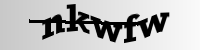

p7dx5


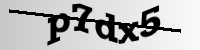

xjjor


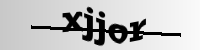

v887p


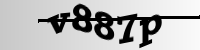

bk5v6


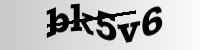

mo7g2


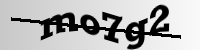

p79a0


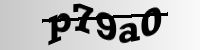

0v8z4


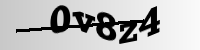

c95s0


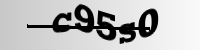

w3uh6


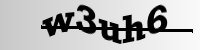

3zgvl


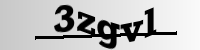

tz0lt


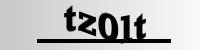

729r4


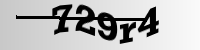

4uo4z


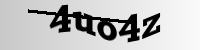

h023o


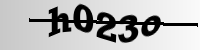

mzn0c


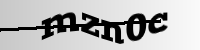

6kkhg


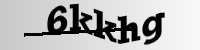

mjll3


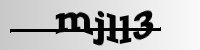

eicia


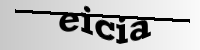

j31th


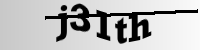

ooxvi


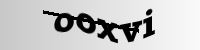

fo9f0


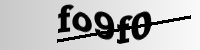

vu6in


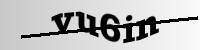

4tnfk


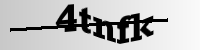

5wj7e


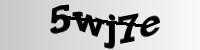

lvs4j


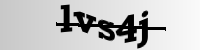

asjab


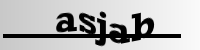

pve6z


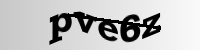

mp3p4


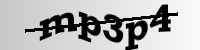

crp5x


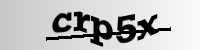

wh95r


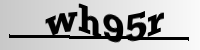

lwbko


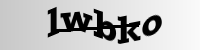

p3awf


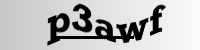

5ds4w


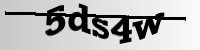

7hnp5


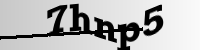

t4uz3


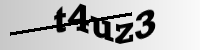

k6a1b


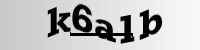

t53v2


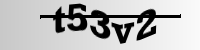

3bfmc


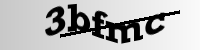

xdddl


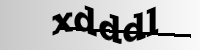

om11f


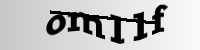

gpdt8


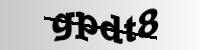

0kv5s


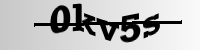

ymj2v


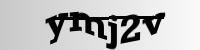

zxlig


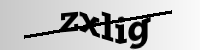

m11ja


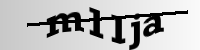

6ug9t


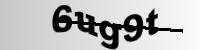

8w9px


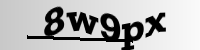

u0nkd


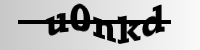

hwwze


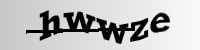

3zkvv


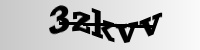

4r61d


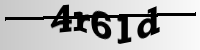

rxuoo


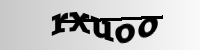

yj7hh


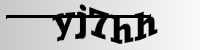

g296w


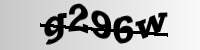

u1nai


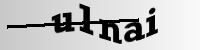

2vuk0


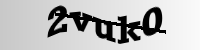

iach0


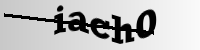

ghwrv


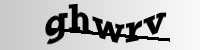

tw19n


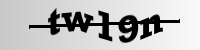

vqzmx


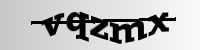

v93mu


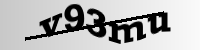

4phqc


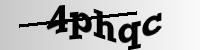

769j8


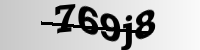

wkmj6


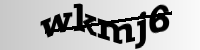

ban8c


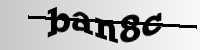

rkoz6


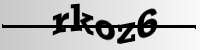

3z5op


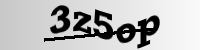

9uihy


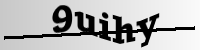

25sh4


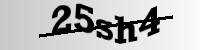

rl2lt


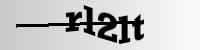

cmqhn


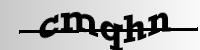

sw93q


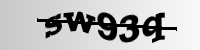

ltn8m


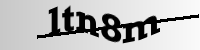

p4t91


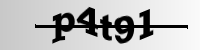

otl2r


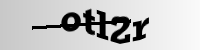

wh2sx


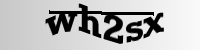

xctha


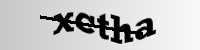

3cpsl


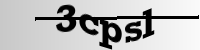

m92pj


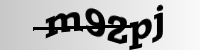

08djv


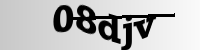

sslun


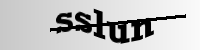

pjrt1


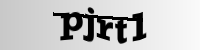

tg635


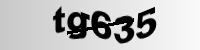

sgzn5


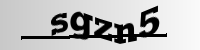

1hmv1


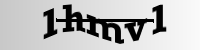

uzr24


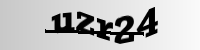

zg38q


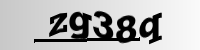

znx7m


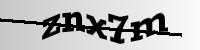

cft2z


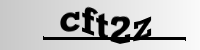

7ucg5


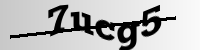

jukvf


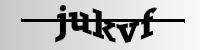

m4wnc


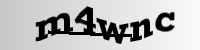

1hs90


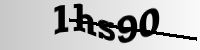

orb2k


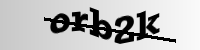

yy8ht


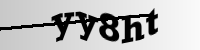

d3e0s


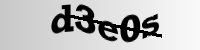

9t108


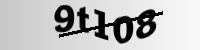

tru2r


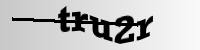

h9za9


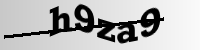

bi3wp


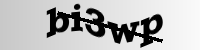

lmluh


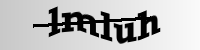

5u6i4


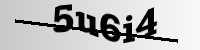

fqk4a


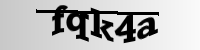

6kkgk


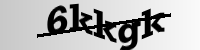

57vt1


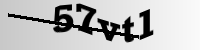

4gumw


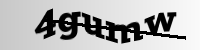

pr4rx


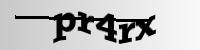

ia72i


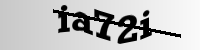

u8t2i


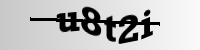

vqdml


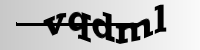

nw7xe


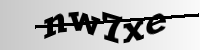

boawe


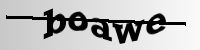

8bcow


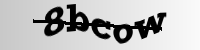

aro81


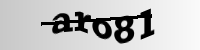

hoaqp


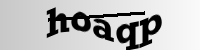

j6nwj


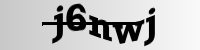

v17ez


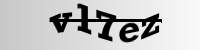

ay4sm


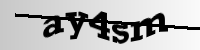

ql96q


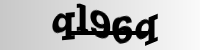

zijho


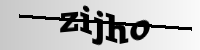

20zeh


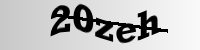

diily


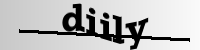

3ek14


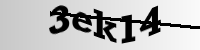

pv1ku


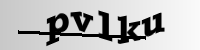

n3dv3


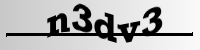

8s6vg


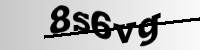

02vnu


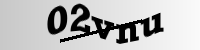

8joby


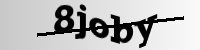

drnuv


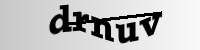

wegi8


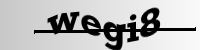

fm1bj


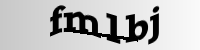

zp0ae


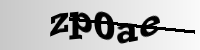

d2msx


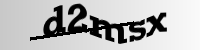

shk59


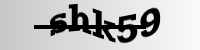

3l3o6


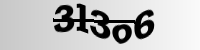

rp0bw


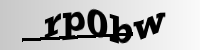

s9ywt


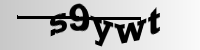

dkolu


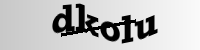

vflcx


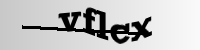

hc81e


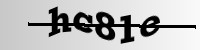

zrbiv


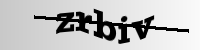

9hcbo


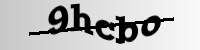

1aluh


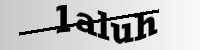

g16se


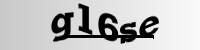

o2gfm


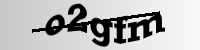

wkdv9


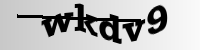

mqa2m


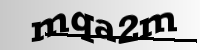

o871r


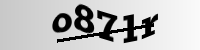

fonvn


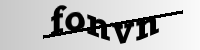

nltho


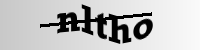

k571z


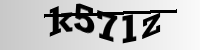

8dlw0


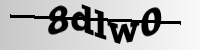

hxl54


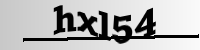

aykzm


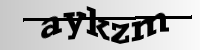

v221x


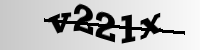

diaf2


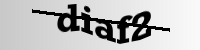

46ck3


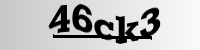

b7n9q


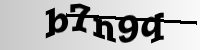

rt7zt


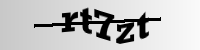

5o6vu


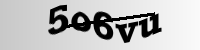

59on4


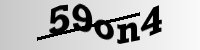

edpzt


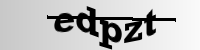

gk9kq


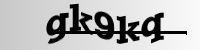

6uqjk


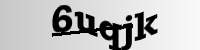

cmz6x


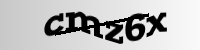

u4f2j


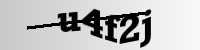

hqmyc


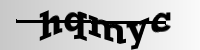

nou4t


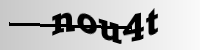

5barv


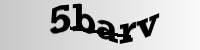

8p05y


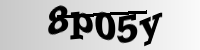

eqmva


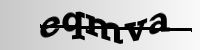

mn520


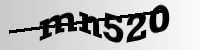

ohamk


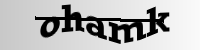

50u6m


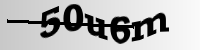

bw4hw


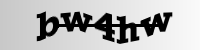

tpz60


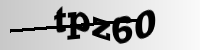

sgmzv


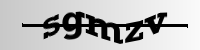

r3zti


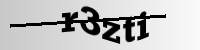

5a9b3


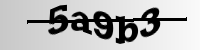

ap3xk


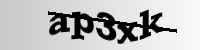

ejn6s


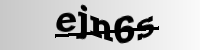

gbiqi


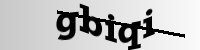

wvssr


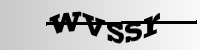

yhr0t


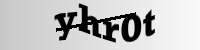

54ibr


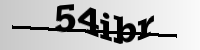

s9598


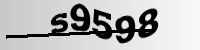

0f0ct


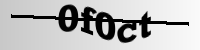

x9kbm


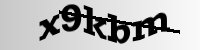

k7zd4


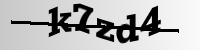

pjnjf


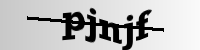

j0o2s


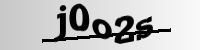

5kywz


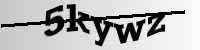

8obpy


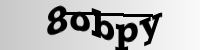

jadtp


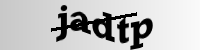

fiinv


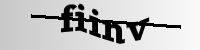

s9bvj


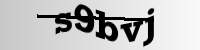

enntj


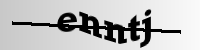

3ra1i


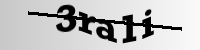

f8m9h


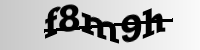

yywvq


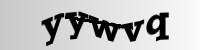

jqw8c


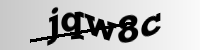

hxcby


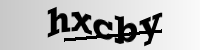

w0epz


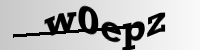

000ks


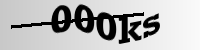

u7uxe


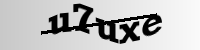

ehkdt


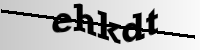

0wl19


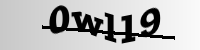

jh8bj


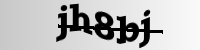

210sf


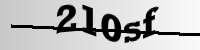

609os


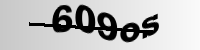

hzgyz


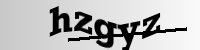

k9gcl


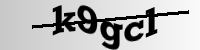

3cb5f


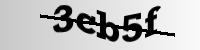

fx0p0


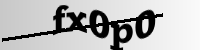

wkj6q


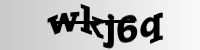

ciaq7


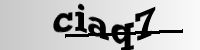

xhxbw


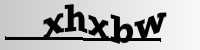

mbvjh


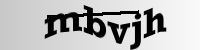

nn4zm


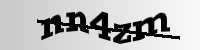

72hm7


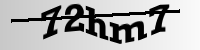

4mj3g


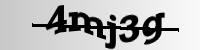

b2tw9


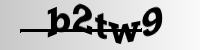

fxw2f


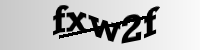

9so9g


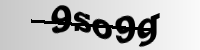

8u6iw


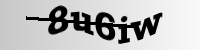

u9ry2


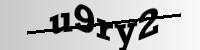

t7usp


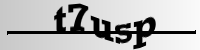

g168w


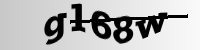

t9p1k


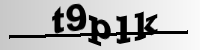

mv3op


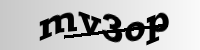

c6t6a


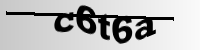

fv10h


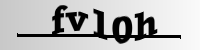

oekxm


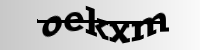

0nh0b


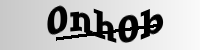

hkjc2


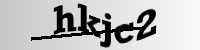

55d9n


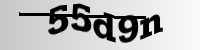

f2ruj


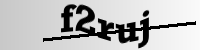

97x0v


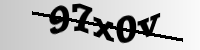

s3oxm


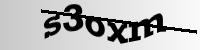

92aqk


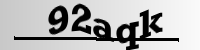

ovags


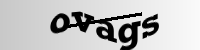

3c2bd


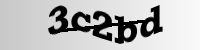

l58bg


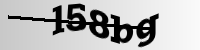

twjkz


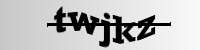

xy9ky


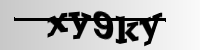

sid2z


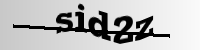

qjc14


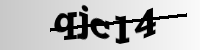

ytm58


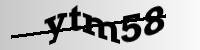

y7ik1


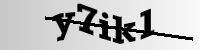

f3ck3


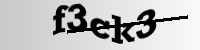

6c10g


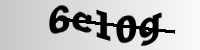

5a6pv


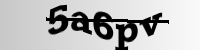

eyt6g


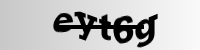

f24ul


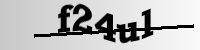

m6sgt


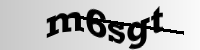

aj9kl


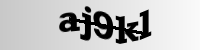

f2ufw


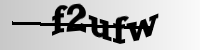

9kcz8


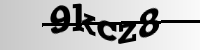

qmid7


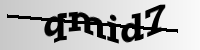

lql3k


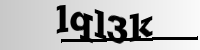

b7qiq


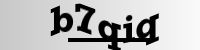

53tlm


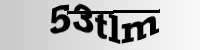

t7rp8


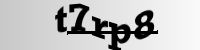

usaro


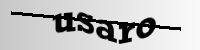

3iifs


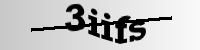

ijtez


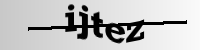

wqw08


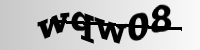

bpqk8


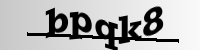

prxyx


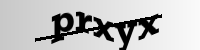

21s78


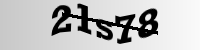

lo0bx


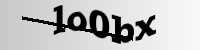

t7cp5


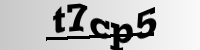

lw07k


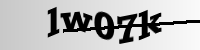

vx51f


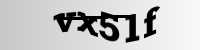

2ev4l


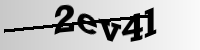

61ex2


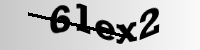

b573r


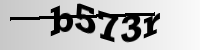

heqgk


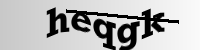

rmzom


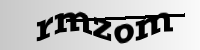

k2h9h


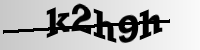

18zkx


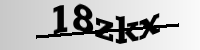

b5lja


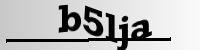

n5xdf


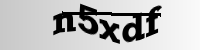

yoz5t


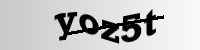

2d16c


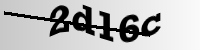

ok6pi


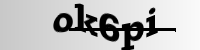

fwe9y


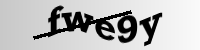

2hxyo


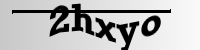

9lpyz


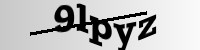

1fawd


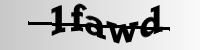

cmb10


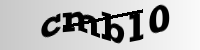

rpgaj


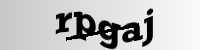

a57nc


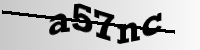

vgou5


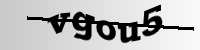

9tcjq


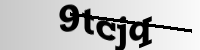

276qf


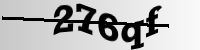

lmnxr


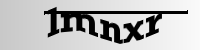

od4gc


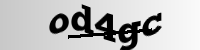

tze7s


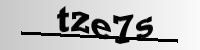

zaaby


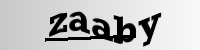

4lybu


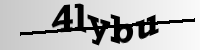

b2k0n


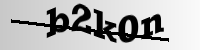

7eb2k


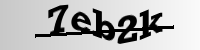

uwhg9


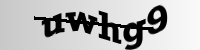

ntafh


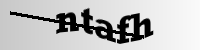

xj0ig


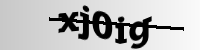

meqal


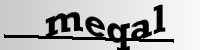

oe39k


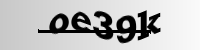

ws6n2


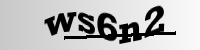

ihqnx


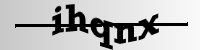

z791e


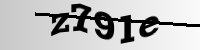

6gcqv


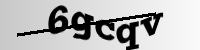

c2kuo


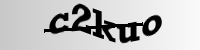

9o922


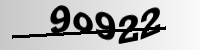

z7t7t


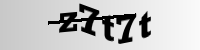

hoke0


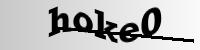

biiff


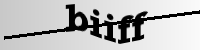

yrn1x


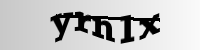

5s9wq


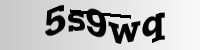

ykxc0


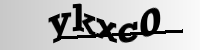

70xtu


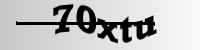

950jq


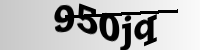

3sl4h


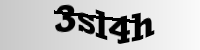

fqqih


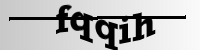

uk173


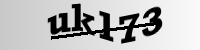

dxl6t


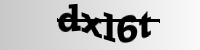

eabld


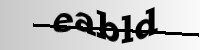

x088w


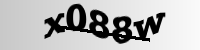

d8qpv


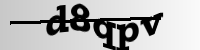

fpbnm


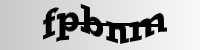

ag4h9


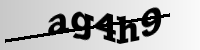

w27g5


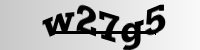

8ufj5


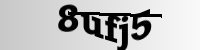

zrqf9


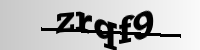

jxkb9


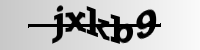

3ns05


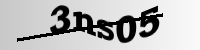

dldal


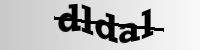

4mlkj


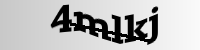

5x75k


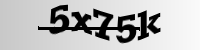

t0j8n


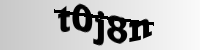

4zmh4


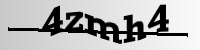

lpo07


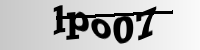

kftug


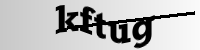

dl7jf


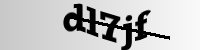

3o5c5


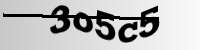

0e67e


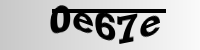

5llju


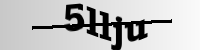

lk0zc


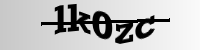

jzb9b


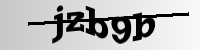

h28hv


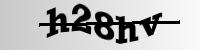

hebnd


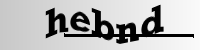

dsxnw


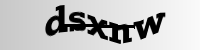

3golu


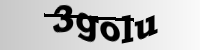

5xhin


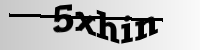

00qjh


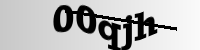

11pra


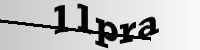

hkek4


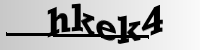

6qejs


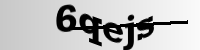

xxwka


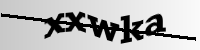

no3qg


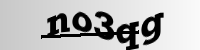

6mykk


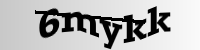

skr5a


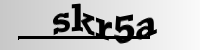

hku9r


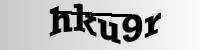

evidy


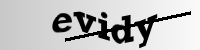

xw08a


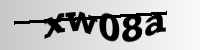

dkrmq


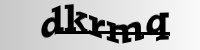

zm4n8


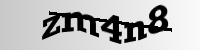

vak2f


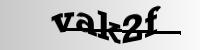

ldbso


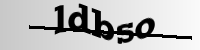

3va2r


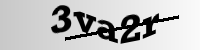

kfhpa


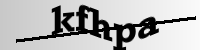

bsyf1


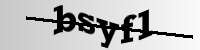

26frj


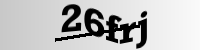

zoela


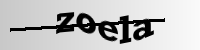

bbh3m


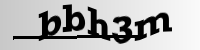

aujjr


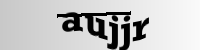

elwzc


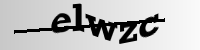

qes3l


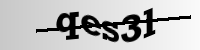

ele2n


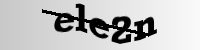

2rzyg


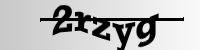

mw7w4


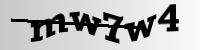

w7n8d


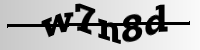

wzyzw


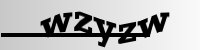

qicl9


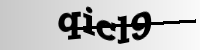

28lba


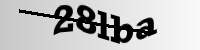

ieddz


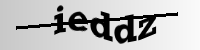

ghga5


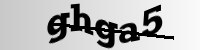

zbgb9


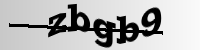

4kuxv


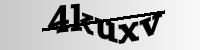

hvgqj


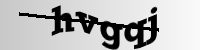

yksjd


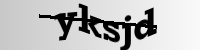

5hc9q


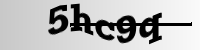

hmuqq


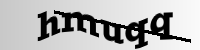

umg0j


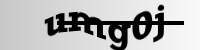

nvfa2


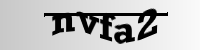

d2x5i


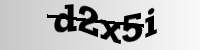

0gzoa


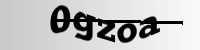

wro3y


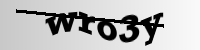

1i696


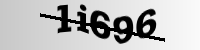

ycqtn


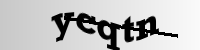

8i85a


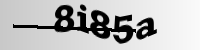

rwziq


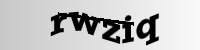

8refe


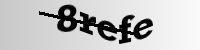

708ge


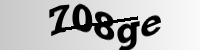

7dlbl


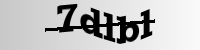

zvcnx


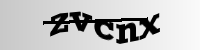

51cpu


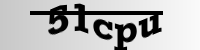

1uvbt


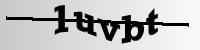

sd380


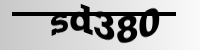

vjnfu


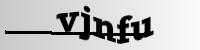

r436r


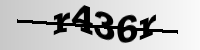

nickk


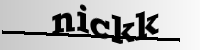

01dha


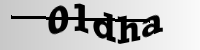

3jbtq


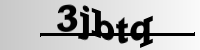

65llj


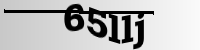

fbpya


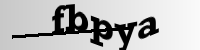

lxt8y


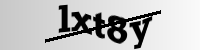

x9ssw


kdjrc


b8l70


xzo6s


9nplx


xx9vt


1tue9


u71uw


t940j


0hlyh


mtyib


3yj7t


xvkyz


3n5nb


dhomu


zlsvb


jsy0p


lzdkz


9eio4


uyllz


kaodj


7m295


qgoov


27cto


o33rx


ksqm1


z5zxh


bpcyy


dwxh1


say25


58jv9


k2v9u


3wb2y


spzte


06eqy


bzzc3


itpyl


fcaog


u9rn1


ai14h


9t3xp


y5w4c


ys673


kds5b


lnp33


dbd4k


qcyer


4aeoe


4qlpt


09yrx


i5y0a


1cw3p


j2t1t


3djep


pa6ju


k8ap0


4ow1j


ji09g


c33zu


rtogu


p7dr5


otrxq


htn3c


ouvzq


67muj


l8gvu


kvjqs


ag4mr


l4vqn


7ghri


9k7mi


qgtgz


lr2lh


3xfdq


1drm7


u3zzw


2wg11


jjne4


a3stn


s4kg3


cqosw


bp3jd


exc4c


s7td1


af9o6


nfr9u


vfddm


bi1hr


oxhvw


i4hxn


16wt7


7puk3


m5lxe


cz00e


t4d6m


5sdmv


b2or7


217o1


30ay8


axrso


fqd90


ustsi


m0zu9


n7vgs


im9kg


kc721


rn0jx


b85yn


qfm0n


ikne2


qkv1z


90eh7


7p9su


0q90q


uemev


eiwgl


tebv2


04780


vurf7


3rc9z


dt4b3


0jiib


y9zi1


itehs


06oa4


poe75


9ezjp


lprto


yfswd


v6ixp


34rd8


hqmk3


00tre


a0auz


ivlb0


pwq25


r6vi6


pduf1


x3r5j


o4cy7


2ib9w


waykf


r3d03


s563k


9kf3q


pyjn3


6s8ud


30p2y


y5spv


8s3ei


u1ks6


8y1ip


wr57g


bhdun


58lkf


wbmlt


s2odm


1d9mv


kc8jv


herd9


4s5xy


n88a4


jhxaf


r1269


z40rg


tbpql


oehjk


v6yf8


jtyzz


iemvq


okvff


7kqei


nq5hd


qr2dn


mqfsb


iu1rp


lmnu6


cifvs


4jbwr


ha5j4


l1vhv


xh4ws


vfadu


53npw


dlfod


l4h60


hv2uc


vokpo


mancm


c8jme


xte8i


yncjx


jz73c


fx5ti


oeggt


5po5h


a7325


2bjgk


iiz07


vdw03


xs3y7


38n9n


zpylh


2oz3f


629d0


6r1fr


d6xmw


7jmvi


ubttm


xybjc


84w1s


agqj2


ou8hn


i7uej


lz8p5


ick03


8xziz


sywwa


7e1sm


5eanv


z55b3


dkjjy


q7z9a


ijt66


kqkj8


21dl1


0kpk1


9zens


gu4se


jwgy0


9s0gd


m4nd5


tmx8g


2bfiw


i0tec


gidqj


gjz24


utzgl


lpr69


x9u3m


f70tt


9d0aa


nwhji


2vam2


12msn


4dpsc


8h4r9


8ctmw


1dshg


wpsl3


g6cs6


zpwk7


w199b


txgsz


vc9xj


uct6p


iws87


tr12x


lxead


2qrm3


pzi73


rgag3


xcf9f


5gqhq


yfoai


j2fku


yutgb


lsqaq


5lhay


3pa4e


32jzs


zfmh7


eepuc


xkebm


rqyoh


o2f93


9pno3


a7flh


n661x


ywqm9


1g305


zn7ur


lnpoa


gic5d


e8y4v


zfohk


oat6n


ssdyk


ad5az


cgjyq


smkj8


64xjo


eqag7


h4uqg


6qolz


hvvr6


tp12f


hh9iy


hwu4g


orjn9


shmh5


9xr4z


614w3


utbci


2bxpm


jixzw


sm4of


cf1zt


swnl8


gcahc


g6m2l


2ph19


3j4ix


fmg52


f3kq6


3ok34


lie7u


e75tf


am7kn


817sy


0e7qa


k4wvd


l7xzh


8pow8


z2f53


6s21w


a6z38


fwhct


z6eee


hvkii


fs596


jnmhd


7j2bh


mykds


hxj9y


xxztk


yrodv


aj7lo


nxoqw


jyh8l


cm7az


izebw


iwc5p


khix8


t75uq


4olse


v9gs2


u7un6


54g34


fpgde


no350


l6180


usege


05y5w


81q4t


xvtz2


67pji


iynfi


c9vsq


sxm7s


9ypd7


34c7u


enlg3


dlg2l


liba3


zulcq


ijxk2


xnk96


13lxq


hbirw


nk1lk


67ws5


uibem


qq4d9


g1nxr


njqrs


cy028


es9fd


ziqn1


0ybvk


5e3uk


2ex5h


pceg6


vrnic


v6d0o


0bkt7


tyj1k


g806m


8nk8o


09std


h1yfe


f4k0q


jaaii


q1fnz


eri0s


qdxql


nanal


u4cvx


96odo


qy1i4


vg1p9


f03a7


jzcpb


7nojm


ybgk9


lmexr


wbtuu


7mevk


krsbo


724n8


hnirm


zc2vt


5zhx5


wxjd7


7nl89


8bn3l


gon6z


v1t8u


oo9ax


07jw1


mtbh5


j0nsj


a2ny5


tkpts


ot1ke


pqp9l


jr1cj


tqdgt


6c64a


lwiab


96ohw


9afz0


0c0qw


m5jsp


6zbvy


4dqig


nucef


iqwqt


it78x


9fqn8


ytxpt


3sf7b


mb8es


w6y30


t42te


1q02n


lyj4s


qudl2


182ta


dfvyn


r4bmi


svd03


9bnuy


fm6pk


o305k


bmdgs


j3ro7


f3quh


zn9i8


101sk


kcyfo


tyzxt


8gii1


3ia85


bowtc


ut9ly


gbh5a


520jk


xp3du


p5xku


pqizq


6pnmd


orjp3


gdmxk


ckxh8


odgl5


u39ab


os3ne


ti0ej


zp7c6


af1a4


iu05e


1j109


9t0u5


kbntv


06vrl


ilnrb


80nfi


0dp0f


0zj92


44285


bk2yi


0442o


mvrr3


egxb3


37bnz


ot3r3


vmiuh


38bt6


5ipb3


ajnt8


pexyk


emp66


1hf4u


kgvqf


l8ic2


6ozz2


raow8


n7c61


hoen9


j67cn


ic1qc


fm9z3


ma3t2


rh51i


qj9p8


h3qyy


jsocs


43pcc


oycvk


0ygpp


b5opu


izfln


7k1tn


652xm


avowm


6plj0


q9pdc


kwdqn


r2m3z


86shw


fft8t


v4384


wc0rs


zw108


pqi45


ypq1y


v5xvl


y9whj


mhj75


hihru


lwm8w


21kqq


4f4of


fmhoq


q5osd


ak6e5


4aaq5


1kq73


hii4t


zn48d


mhgvu


iua1w


inire


3qonb


3lnm3


smyl7


4xvxt


sg5nz


tr8bt


yk8kc


rae3o


arcpy


cnow8


u99ho


jjfrz


p2djl


e1you


f2akl


s910x


9ut0w


osbyc


3in44


lsarp


u6xj0


f2qsl


rpno7


nyzrt


h4s07


2piua


6juje


2q07m


u7djl


sgqcl


6uc1s


752sz


ody05


dtiui


zwi33


ziinh


nygda


fycgy


shfqy


37ofn


4g7sv


efg94


q8tdz


ra8fb


2hypq


5dznj


zt01x


ay43a


lye3w


l5omr


qcf3e


In [ ]:
for i in range(10000):
    label = generateRandomLabel()
    final_img = generateImageFromLabel(label)
    final_img.save(output_path+label+".png", "PNG")